<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b> 📚 Importing Neccessary library 📚</b></div>

In [1]:
import pandas as pd
import numpy as np
from textblob import TextBlob
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from colorama import Fore, Style
import io
from IPython.display import display
import seaborn as sns
from math import pi
import random
import math
import re
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.cluster import KMeans
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from pandas.plotting import parallel_coordinates
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LinearRegression
import plotly.express as px 
from sklearn.decomposition import PCA
from scipy.stats import skew, norm
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings("ignore") 
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None) 

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>⏳ Loading Datset ⏳</b></div>

In [2]:
df = pd.read_csv(r"C:\Users\Dell\OneDrive\Desktop\telcom_data.csv")

In [3]:
df.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),HTTP DL (Bytes),HTTP UL (Bytes),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with 125000B < Vol DL,Nb of sec with 1250B < Vol UL < 6250B,Nb of sec with 31250B < Vol DL < 125000B,Nb of sec with 37500B < Vol UL,Nb of sec with 6250B < Vol DL < 31250B,Nb of sec with 6250B < Vol UL < 37500B,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.311450e+19,4/4/19 12:01,770.0,4/25/19 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16457E+15,42.0,5.0,23.0,44.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,37624.0,38787.0,1.823653e+09,Samsung,Samsung Galaxy A5 Sm-A520F,NaN,NaN,NaN,NaN,NaN,NaN,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311450e+19,4/9/19 13:04,235.0,4/25/19 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,65.0,5.0,16.0,26.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,168.0,3560.0,1.365104e+09,Samsung,Samsung Galaxy J5 (Sm-J530),NaN,NaN,NaN,NaN,NaN,NaN,971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311450e+19,4/9/19 17:42,1.0,4/25/19 11:58,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,NaN,NaN,6.0,9.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,1.361763e+09,Samsung,Samsung Galaxy A8 (2018),NaN,NaN,NaN,NaN,NaN,NaN,751.0,695.0,1684053.0,42224.0,8535055.0,1694064.0,2690151.0,672973.0,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311450e+19,4/10/19 0:31,486.0,4/25/19 7:36,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,NaN,NaN,44.0,44.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,3330.0,37882.0,1.321510e+09,undefined,undefined,NaN,NaN,NaN,NaN,NaN,NaN,17.0,207.0,644121.0,13372.0,9023734.0,2788027.0,1439754.0,631229.0,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311450e+19,4/12/19 20:10,565.0,4/25/19 10:40,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,NaN,NaN,6.0,9.0,NaN,NaN,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,1.089009e+09,Samsung,Samsung Sm-G390F,NaN,NaN,NaN,NaN,NaN,NaN,607.0,604.0,862600.0,50188.0,6248284.0,1500559.0,1936496.0,173853.0,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🧠 Data Exploration: 🧠</b></div>

In [4]:
print("Dataset has ",df.shape[0],"Records/Rows and ",df.shape[1],"attributes/columns.")

Dataset has  150001 Records/Rows and  55 attributes/columns.


In [5]:
#Generating Basic Information of Dataset.
df.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Columns: 55 entries, Bearer Id to Total DL (Bytes)
dtypes: float64(50), object(5)
memory usage: 62.9+ MB


<div style="border-radius:10px; border:gray solid; padding: 15px; background-color: khaki; font-size:100%; text-align:left">
    
<h3 align="left"><font color="brown">📊 Inference:</font></h3>

* There is total **150001 records/rows** and **55 attributes/columns.**
* Out of **55 columns**, **50 columns are numerical** and **5 columns are categorical.**
</div>

In [6]:
#info means it returns all information about the dataframe
buffer = io.StringIO()
df.info(buf=buffer)
info_output = buffer.getvalue()
colors = [
    Style.BRIGHT + Fore.RED, 
    Style.BRIGHT + Fore.GREEN, 
    Style.BRIGHT + Fore.BLUE, 
    Style.BRIGHT + Fore.CYAN, 
    Style.BRIGHT + Fore.MAGENTA, 
    Style.BRIGHT + Fore.YELLOW
]
lines = info_output.split('\n')
formatted_lines = []
for i, line in enumerate(lines):
    if 'Column' in line or 'non-null' in line: 
        color = colors[i % len(colors)]  
        formatted_lines.append(color + line + Style.RESET_ALL)
    else:
        formatted_lines.append(line)
formatted_output = '\n'.join(formatted_lines)
print(formatted_output)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Bearer Id                                 149010 non-null  float64
 1   Start                                     150000 non-null  object 
 2   Start ms                                  150000 non-null  float64
 3   End                                       150000 non-null  object 
 4   End ms                                    150000 non-null  float64
 5   Dur. (ms)                                 150000 non-null  float64
 6   IMSI                                      149431 non-null  float64
 7   MSISDN/Number                             148935 non-null  float64
 8   IMEI                                      149429 non-null  float64
 9   Last Location Name                        148848 non-null  object 
 10  Avg RTT DL (ms)     

In [7]:
#finding the missing value in percentage of each column
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum() / df.shape[0] * 100).round(2).sort_values(ascending=False)
summary = pd.concat([total, percent], axis=1, keys=['Total null value', 'Percentage of null value'])
summary.style.background_gradient(subset=['Percentage of null value'], cmap='coolwarm')

,Total null value,Percentage of null value
Nb of sec with 37500B < Vol UL,130254,86.840000
Nb of sec with 6250B < Vol UL < 37500B,111843,74.560000
Nb of sec with 125000B < Vol DL,97538,65.020000
TCP UL Retrans. Vol (Bytes),96649,64.430000
Nb of sec with 31250B < Vol DL < 125000B,93586,62.390000
Nb of sec with 1250B < Vol UL < 6250B,92894,61.930000
Nb of sec with 6250B < Vol DL < 31250B,88317,58.880000
TCP DL Retrans. Vol (Bytes),88146,58.760000
HTTP UL (Bytes),81810,54.540000
HTTP DL (Bytes),81474,54.320000


In [8]:
null_df = df.isnull().sum()[df.isnull().sum()>0].sort_values().to_frame().rename(columns={0:"Total Missing values"})
null_df["% of Missing Values"] = round(null_df["Total Missing values"]/len(df)*100,2)
null_df["Data Type"] = df[null_df.index.tolist()].dtypes

In [9]:
null_df

,Total Missing values,% of Missing Values,Data Type
Total DL (Bytes),1,0.00,float64
Start,1,0.00,object
Start ms,1,0.00,float64
End,1,0.00,object
End ms,1,0.00,float64
Dur. (ms),1,0.00,float64
Activity Duration DL (ms),1,0.00,float64
Activity Duration UL (ms),1,0.00,float64
Avg Bearer TP UL (kbps),1,0.00,float64
Total UL (Bytes),1,0.00,float64


In [10]:
#finding duplicate value of entire data
df.duplicated().sum()

0

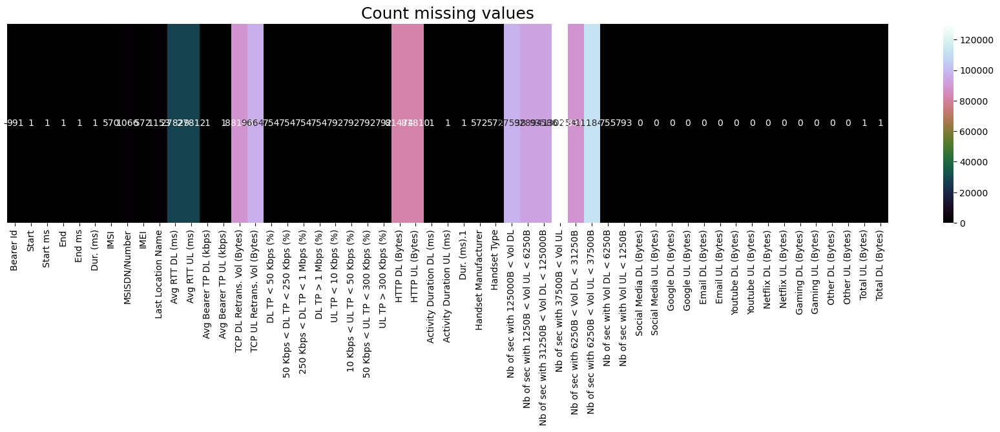

In [11]:
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='cubehelix', annot=True,
             fmt='0.0f').set_title('Count missing values', fontsize=18)
plt.show()

In [12]:
#identify garbage value
for i in df.select_dtypes(include='object').columns:
    print(df[i].value_counts())
    print("***"*5)

Start
4/26/19 7:25     203
4/26/19 7:26     190
4/26/19 7:36     175
4/26/19 7:30     160
4/26/19 7:46     143
4/26/19 7:49     138
4/26/19 7:40     135
4/26/19 8:25     135
4/26/19 7:45     133
4/26/19 7:31     132
4/26/19 7:27     132
4/26/19 7:35     130
4/26/19 7:29     130
4/26/19 7:37     129
4/26/19 7:50     126
4/26/19 7:51     126
4/26/19 7:39     125
4/26/19 7:44     124
4/26/19 7:54     124
4/26/19 7:28     120
4/26/19 7:43     120
4/24/19 20:51    118
4/26/19 7:53     118
4/24/19 20:23    117
4/26/19 7:38     115
4/25/19 7:35     115
4/26/19 8:26     114
4/24/19 20:58    114
4/25/19 7:54     113
4/26/19 8:58     112
4/26/19 7:52     112
4/26/19 7:48     112
4/24/19 20:13    111
4/26/19 9:00     109
4/26/19 7:41     109
4/29/19 7:08     109
4/24/19 20:31    109
4/26/19 8:56     108
4/27/19 17:25    108
4/26/19 7:55     108
4/24/19 20:48    108
4/26/19 7:47     108
4/27/19 17:13    107
4/24/19 21:01    107
4/29/19 7:25     107
4/26/19 7:34     106
4/26/19 8:28     105
4/26/19

In [13]:
#finding columns of entire data
colors = [Fore.RED, Fore.GREEN, Fore.BLUE, Fore.CYAN, Fore.MAGENTA, Fore.YELLOW]
colorful_columns = [
    f"{colors[i % len(colors)]}{col}{Style.RESET_ALL}" for i, col in enumerate(df.columns)
]
print("Index(['" + "', '".join(colorful_columns) + "'], dtype='object')")

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI', 'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)', 'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)', 'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)', '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)', 'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)', '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)', 'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer', 'Handset Type', 'Nb of sec with 125000B < Vol DL', 'Nb of sec with 1250B < Vol UL < 6250B', 'Nb of sec with 31250B < Vol DL < 125000B', 'Nb of sec with 37500B < Vol UL', 'Nb of sec with 6250B < Vol DL < 31250B', 'Nb of sec with 6250B < Vol UL < 37500B', 'Nb of sec with Vol DL < 6250B', 'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)', 'Social Medi

In [14]:
# finding number of int dtype columns
int_columns = df.select_dtypes(include=["int64"]).columns
print(Style.BRIGHT+Fore.RED + "Total number of integer columns:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(int_columns.shape[0]) + Style.RESET_ALL)
print(Style.BRIGHT+Fore.RED + "Integer columns name:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(int_columns.tolist()) + Style.RESET_ALL)

Total number of integer columns: 0
Integer columns name: []


In [15]:
# finding number of Float dtype columns
float_columns = df.select_dtypes(include=["float64"]).columns
print(Style.BRIGHT+Fore.RED + "Total number of Float columns:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(float_columns.shape[0]) + Style.RESET_ALL)
print(Style.BRIGHT+Fore.RED + "Float columns name:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(float_columns.tolist()) + Style.RESET_ALL)

Total number of Float columns: 50
Float columns name: ['Bearer Id', 'Start ms', 'End ms', 'Dur. (ms)', 'IMSI', 'MSISDN/Number', 'IMEI', 'Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)', 'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)', 'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)', '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)', 'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)', '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)', 'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1', 'Nb of sec with 125000B < Vol DL', 'Nb of sec with 1250B < Vol UL < 6250B', 'Nb of sec with 31250B < Vol DL < 125000B', 'Nb of sec with 37500B < Vol UL', 'Nb of sec with 6250B < Vol DL < 31250B', 'Nb of sec with 6250B < Vol UL < 37500B', 'Nb of sec with Vol DL < 6250B', 'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)', 'Social Media UL (Bytes)', 'Google DL (Byt

In [16]:
# finding number of categorical dtype columns
cat_columns = df.select_dtypes(include=["object"]).columns
print(Style.BRIGHT+Fore.RED + "Total number of categorical columns:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(cat_columns.shape[0]) + Style.RESET_ALL)
print(Style.BRIGHT+Fore.RED + "categorical columns name:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(cat_columns.tolist()) + Style.RESET_ALL)

Total number of categorical columns: 5
categorical columns name: ['Start', 'End', 'Last Location Name', 'Handset Manufacturer', 'Handset Type']


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>✨ Feature Engineering ✨</b></div>

## Missing Value Treatments

In [17]:
#choose the method of imputing missing value
#like mean,median,mode or Knn imputer

In [18]:
#Replace missing values in Float columns with the "median" of each column.
for i in ["Total DL (Bytes)","Start ms","End ms","Dur. (ms)","Activity Duration DL (ms)","Activity Duration UL (ms)","Avg Bearer TP UL (kbps)","Total UL (Bytes)","Dur. (ms).1","Avg Bearer TP DL (kbps)","IMSI","IMEI","DL TP < 50 Kbps (%)","50 Kbps < DL TP < 250 Kbps (%)","250 Kbps < DL TP < 1 Mbps (%)","DL TP > 1 Mbps (%)","Nb of sec with Vol DL < 6250B","UL TP > 300 Kbps (%)","UL TP < 10 Kbps (%)","10 Kbps < UL TP < 50 Kbps (%)","50 Kbps < UL TP < 300 Kbps (%)","Nb of sec with Vol UL < 1250B","Bearer Id","MSISDN/Number","Avg RTT UL (ms)","Avg RTT DL (ms)"]:
    df[i].fillna(df[i].median(),inplace= True) 

In [19]:
#Replace missing values in categorical columns with the "mode" of each column
for i in ["Handset Manufacturer","Handset Type","Last Location Name","Start","End"]:
    df[i].fillna(df[i].mode()[0],inplace= True) 

In [20]:
#We observed that after filling the null values in some Float&categorical columns, a few columns are still showing null values 
# We will delete these columns because they have over 55-85% null values
null_df = df.isnull().sum()[df.isnull().sum()>0].sort_values().to_frame().rename(columns={0:"Total Missing values"})
null_df["% of Missing Values"] = round(null_df["Total Missing values"]/len(df)*100,2)
null_df["Data Type"] = df[null_df.index.tolist()].dtypes

In [21]:
null_df

,Total Missing values,% of Missing Values,Data Type
HTTP DL (Bytes),81474,54.32,float64
HTTP UL (Bytes),81810,54.54,float64
TCP DL Retrans. Vol (Bytes),88146,58.76,float64
Nb of sec with 6250B < Vol DL < 31250B,88317,58.88,float64
Nb of sec with 1250B < Vol UL < 6250B,92894,61.93,float64
Nb of sec with 31250B < Vol DL < 125000B,93586,62.39,float64
TCP UL Retrans. Vol (Bytes),96649,64.43,float64
Nb of sec with 125000B < Vol DL,97538,65.02,float64
Nb of sec with 6250B < Vol UL < 37500B,111843,74.56,float64
Nb of sec with 37500B < Vol UL,130254,86.84,float64


In [22]:
# Here, we have deleted some columns that have more than 55-85% values 
df1 = df.drop(columns=['HTTP DL (Bytes)','HTTP UL (Bytes)','TCP DL Retrans. Vol (Bytes)','Nb of sec with 6250B < Vol DL < 31250B','Nb of sec with 1250B < Vol UL < 6250B','Nb of sec with 31250B < Vol DL < 125000B','TCP UL Retrans. Vol (Bytes)','Nb of sec with 125000B < Vol DL','Nb of sec with 6250B < Vol UL < 37500B','Nb of sec with 37500B < Vol UL'], axis=1)

In [23]:
#checkin column after deleting some column
df1.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1',
       'Handset Manufacturer', 'Handset Type', 'Nb of sec with Vol DL < 6250B',
       'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)',
       'Social Media UL (Bytes)', 'Google DL (Bytes)', 'Google UL (Bytes)',
       'Email DL (Bytes)', 'Email UL (Bytes)', 'Youtube DL (Bytes)',
       'Youtube UL (Bytes)', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)',
       'Gaming DL (Bytes)', 'Gaming UL (Bytes)', 'Other DL (Bytes)',


In [24]:
#checking null value after filling 
total = df1.isnull().sum().sort_values(ascending=False)
percent = (df1.isnull().sum() / df1.shape[0] * 100).round(2).sort_values(ascending=False)
summary = pd.concat([total, percent], axis=1, keys=['Total null value', 'Percentage of null value'])
summary.style.background_gradient(subset=['Percentage of null value'], cmap='coolwarm')

,Total null value,Percentage of null value
Bearer Id,0,0.000000
Activity Duration UL (ms),0,0.000000
Handset Manufacturer,0,0.000000
Handset Type,0,0.000000
Nb of sec with Vol DL < 6250B,0,0.000000
Nb of sec with Vol UL < 1250B,0,0.000000
Social Media DL (Bytes),0,0.000000
Social Media UL (Bytes),0,0.000000
Google DL (Bytes),0,0.000000
Google UL (Bytes),0,0.000000


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>✨ Treatments with columns ✨</b></div>

In [25]:
#We have changed the data type of the 'start' and 'End' columns to datetime format because they were previously in object form.
df1['Start'] = pd.to_datetime(df1['Start'])
df1['End'] = pd.to_datetime(df1['End'])
print(df1.dtypes)

Bearer Id                                float64
Start                             datetime64[ns]
Start ms                                 float64
End                               datetime64[ns]
End ms                                   float64
Dur. (ms)                                float64
IMSI                                     float64
MSISDN/Number                            float64
IMEI                                     float64
Last Location Name                        object
Avg RTT DL (ms)                          float64
Avg RTT UL (ms)                          float64
Avg Bearer TP DL (kbps)                  float64
Avg Bearer TP UL (kbps)                  float64
DL TP < 50 Kbps (%)                      float64
50 Kbps < DL TP < 250 Kbps (%)           float64
250 Kbps < DL TP < 1 Mbps (%)            float64
DL TP > 1 Mbps (%)                       float64
UL TP < 10 Kbps (%)                      float64
10 Kbps < UL TP < 50 Kbps (%)            float64
50 Kbps < UL TP < 30

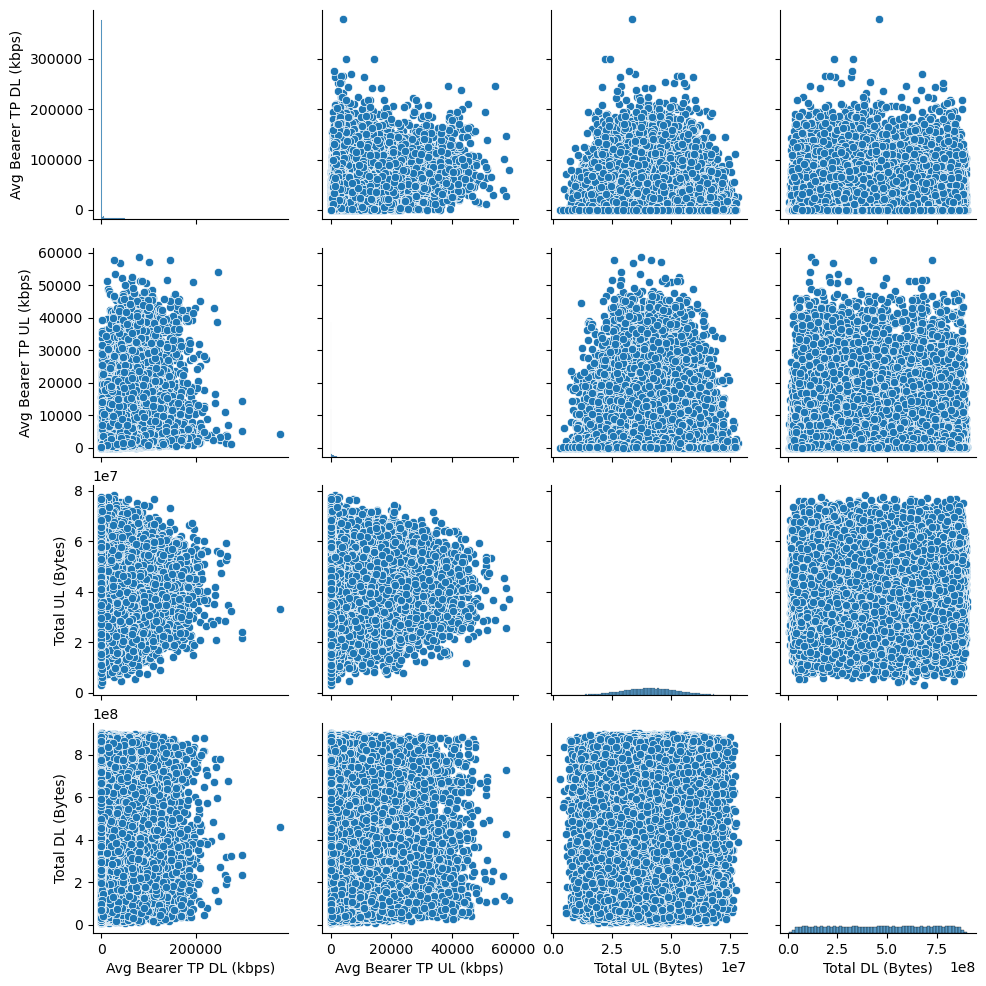

In [26]:
selected_vars = ['Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)', 'Total UL (Bytes)', 'Total DL (Bytes)']
sns.pairplot(df1, vars=selected_vars, palette='coolwarm')
plt.show()

# Insights from the Chart

Throughput Correlations: There is a slight positive correlation between Avg Bearer TP DL (kbps) and Avg Bearer TP UL (kbps), suggesting that as the download throughput increases, the upload throughput also tends to increase.

Download vs. Upload Behavior: Both Total DL (Bytes) and Total UL (Bytes) show strong positive correlations with their respective throughput values. This means higher total downloaded and uploaded data are generally associated with higher throughput.

Interdependence of Total Bytes: The relationship between Total UL (Bytes) and Total DL (Bytes) shows a strong positive correlation, indicating that an increase in one often coincides with an increase in the other.

Variability in Throughput: While the pair plot showed a positive correlation between download and upload throughput, you might want to check for outliers. If certain instances have extremely low throughput, they could indicate network congestion or device limitations.

Network Optimization Opportunities: If the correlation between upload and download throughput is inconsistent in some cases, it might highlight areas where network optimization can help. For example, sudden drops could indicate bandwidth limitations or packet loss.

Time-based Insights: If timestamp data is available, you could analyze throughput variations across time intervals to identify peak and off-peak usage trends.

Overall, the pair plot highlights key interactions between download and upload behaviors, which could be useful for network optimization.

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>✨ Exploratory Data Analysis(EDA) ✨</b></div>

In [27]:
# finding Descriptive Statistics of dataset
df1.describe().T

,count,mean,min,25%,50%,75%,max,std
Bearer Id,150001.0,10120446025493164032.0,6917540000000000000.0,7349880000000000000.0,7349880000000000000.0,13042400000000000000.0,13186500000000000000.0,2892434975685706752.0
Start,150001,2019-04-26 12:36:09.492336640,2019-04-04 12:01:00,2019-04-25 00:26:00,2019-04-26 08:51:00,2019-04-27 18:18:00,2019-04-29 07:28:00,NaN
Start ms,150001.0,499.188199,0.0,250.0,499.0,749.0,999.0,288.610872
End,150001,2019-04-27 17:39:37.127752192,2019-04-24 22:59:00,2019-04-26 07:30:00,2019-04-27 23:02:00,2019-04-29 07:15:00,2019-04-30 23:59:00,NaN
End ms,150001.0,498.800888,0.0,251.0,500.0,750.0,999.0,288.096693
Dur. (ms),150001.0,104608.43895,7142.0,57442.0,86399.0,132430.0,1859336.0,81037.364992
IMSI,150001.0,208201639297045.625,204047108489451.0,208201401264956.0,208201546329113.0,208201771607314.0,214074303349628.0,21447225377.498219
MSISDN/Number,150001.0,41824409439.846291,33601001722.0,33651508781.0,33663706799.0,33683072356.0,882397108489451.0,2438731368208.442871
IMEI,150001.0,48425918621507.8125,440015202000.0,35462609538986.0,35722009426311.0,86119704277453.0,99001201327774.0,22387392564342.691406
Avg RTT DL (ms),150001.0,97.774455,0.0,35.0,45.0,62.0,96923.0,559.909444


In [28]:
#object column descriptive statistics
df1.describe(include="object").T

,count,unique,top,freq
Last Location Name,150001,45036,9.16457E+15,3034
Handset Manufacturer,150001,170,Apple,60137
Handset Type,150001,1396,Huawei B528S-23A,20324


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>✨ Outliers Detection ✨</b></div>

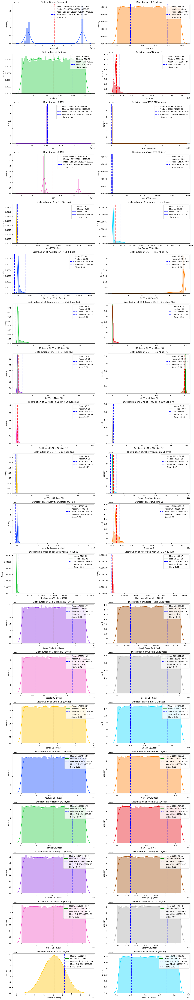

In [29]:
#Here we are checking the data through distplot to see how much each column is skewed
numeric_cols = df1.select_dtypes(include=['number']).columns
plt.figure(figsize=(15, 80))
for i, col in enumerate(numeric_cols):
    ax = plt.subplot(len(numeric_cols) // 2 + 1, 2, i + 1)
    
    sns.distplot(df1[col], 
                 color=sns.color_palette("bright", len(numeric_cols))[i], 
                 kde=True,
                 ax=ax)
    ax.set_title(f'Distribution of {col}')
    
    mean = df1[col].mean()
    std_dev = df1[col].std()
    median = df1[col].median()
    skewness = df1[col].skew()
    
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(median, color='green', linestyle='-', label=f'Median: {median:.2f}')
    ax.axvline(mean + std_dev, color='blue', linestyle='-.', label=f'Mean+Std: {mean + std_dev:.2f}')
    ax.axvline(mean - std_dev, color='blue', linestyle='-.', label=f'Mean-Std: {mean - std_dev:.2f}')
    skew_line = Line2D([], [], color='purple', linestyle=':', label=f'Skew: {skewness:.2f}')
    handles, labels = ax.get_legend_handles_labels()
    handles.append(skew_line)
    labels.append(f'Skew: {skewness:.2f}')
    
    ax.legend(handles=handles, loc='upper right')

plt.tight_layout()
plt.show()

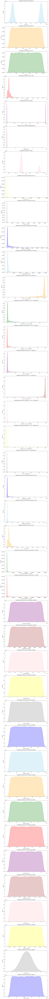

In [30]:
# Plot Probability Density Plot (Kernel Density Estimation) for each numerical column
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'yellow', 'gray', 'blue']
num_cols = len(df1.select_dtypes(include=['number']).columns)
fig, axes = plt.subplots(num_cols, 1, figsize=(10, 5*num_cols))
for i, col in enumerate(df1.select_dtypes(include=['int', 'float']).columns):
    color = colors[i % len(colors)]  
    sns.kdeplot(data=df1[col], ax=axes[i], color=color, shade=True)
    axes[i].set_title(f'Probability Density Plot of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')
plt.tight_layout()
plt.show()

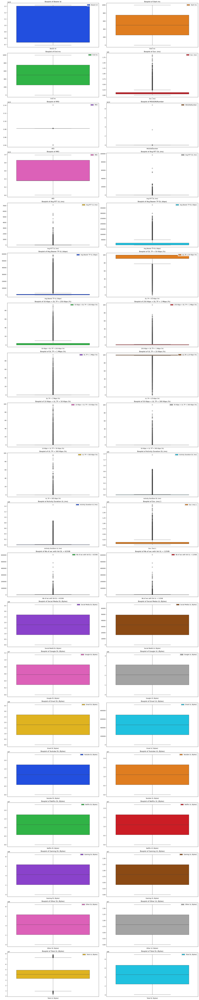

In [31]:
#Here, we have checked for outliers using a boxplot
numeric_cols = df1.select_dtypes(include=['number']).columns

num_rows = (len(numeric_cols) + 1) // 2

fig, axes = plt.subplots(ncols=2, nrows=num_rows, figsize=(20, num_rows * 5))
for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df1[[col]], ax=axes[i//2][i%2], color=sns.color_palette("bright", len(numeric_cols))[i])
    axes[i//2][i%2].set_title(f'Boxplot of {col}')
    axes[i//2][i%2].legend([col], loc='upper right')
for j in range(len(numeric_cols), num_rows * 2):
    fig.delaxes(axes.flatten()[j])
plt.tight_layout()
plt.show()

In [32]:
# Here, we have calculated the number of outliers for each column
num_cols = df1.select_dtypes(include='number')

Q1 = num_cols.quantile(0.25)
Q3 = num_cols.quantile(0.75)
IQR = Q3 - Q1
outliers = ((num_cols < (Q1 - 1.5 * IQR)) | (num_cols > (Q3 + 1.5 * IQR)))
num_outliers = outliers.sum()
color_mapping = {
    "red": "\033[1;91m",       
    "yellow": "\033[1;93m",    
    "green": "\033[1;92m",     
    "cyan": "\033[1;96m",      
    "blue": "\033[1;94m",      
    "magenta": "\033[1;95m",   
    "white": "\033[1;97m"     
}
reset_color = "\033[0m"  
color_names = ["red", "yellow", "green", "cyan", "blue", "magenta", "white"]
print("Columns with potential outliers:")
for i, (column, count) in enumerate(num_outliers.items()):
    if count > 0:  
        color_name = color_names[i % len(color_names)]  
        row_color = color_mapping[color_name] 
        print(f"{row_color}{column}: {count} outliers{reset_color}")

Columns with potential outliers:
Dur. (ms): 7184 outliers
IMSI: 13250 outliers
MSISDN/Number: 24948 outliers
Avg RTT DL (ms): 17792 outliers
Avg RTT UL (ms): 20116 outliers
Avg Bearer TP DL (kbps): 13235 outliers
Avg Bearer TP UL (kbps): 21531 outliers
DL TP < 50 Kbps (%): 18352 outliers
50 Kbps < DL TP < 250 Kbps (%): 15220 outliers
250 Kbps < DL TP < 1 Mbps (%): 29751 outliers
DL TP > 1 Mbps (%): 37066 outliers
UL TP < 10 Kbps (%): 22123 outliers
10 Kbps < UL TP < 50 Kbps (%): 31999 outliers
50 Kbps < UL TP < 300 Kbps (%): 4543 outliers
UL TP > 300 Kbps (%): 2457 outliers
Activity Duration DL (ms): 26659 outliers
Activity Duration UL (ms): 26022 outliers
Dur. (ms).1: 7184 outliers
Nb of sec with Vol DL < 6250B: 24785 outliers
Nb of sec with Vol UL < 1250B: 25389 outliers
Total UL (Bytes): 243 outliers


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown>📊 Inference:</font></h3>

* We have observed that some columns contain high-value outliers.
* So we will cap them using the IQR (Interquartile Range) method.

* The formula for the Interquartile Range (IQR) is:

IQR = Q3 - Q1

Where:
- \( Q1 \) (First Quartile) is the 25th percentile of the data.
- \( Q3 \) (Third Quartile) is the 75th percentile of the data.

The IQR represents the middle 50% of the data and is used to identify outliers. Any value below \( Q1 - 1.5 \times IQR \) or above \( Q3 + 1.5 \times IQR \) is considered an outlier.

We have skipped some columns here because their IQR value is 0.

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>⚙️ Capping Outliers ⚙️</b></div>

In [33]:
#cheking the dataset
df1.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.311450e+19,2019-04-04 12:01:00,770.0,2019-04-25 14:35:00,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16457E+15,42.0,5.0,23.0,44.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,37624.0,38787.0,1.823653e+09,Samsung,Samsung Galaxy A5 Sm-A520F,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311450e+19,2019-04-09 13:04:00,235.0,2019-04-25 08:15:00,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,65.0,5.0,16.0,26.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,168.0,3560.0,1.365104e+09,Samsung,Samsung Galaxy J5 (Sm-J530),971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311450e+19,2019-04-09 17:42:00,1.0,2019-04-25 11:58:00,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,45.0,5.0,6.0,9.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,1.361763e+09,Samsung,Samsung Galaxy A8 (2018),751.0,695.0,1684053.0,42224.0,8535055.0,1694064.0,2690151.0,672973.0,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311450e+19,2019-04-10 00:31:00,486.0,2019-04-25 07:36:00,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,45.0,5.0,44.0,44.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,3330.0,37882.0,1.321510e+09,undefined,undefined,17.0,207.0,644121.0,13372.0,9023734.0,2788027.0,1439754.0,631229.0,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311450e+19,2019-04-12 20:10:00,565.0,2019-04-25 10:40:00,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,45.0,5.0,6.0,9.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,1.089009e+09,Samsung,Samsung Sm-G390F,607.0,604.0,862600.0,50188.0,6248284.0,1500559.0,1936496.0,173853.0,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


In [34]:
# Here, outliers have been capped using the IQR (Interquartile Range) method for each column
# Here, we have skipped the columns where the IQR (Interquartile Range) variability is 0 because it was causing all the values in those columns to be converted to 0

numerical_columns = df1.select_dtypes(include=['number']).columns

def cap_outliers(df1, column):
    Q1 = df1[column].quantile(0.25)
    Q3 = df1[column].quantile(0.75)
    IQR = Q3 - Q1
    if IQR == 0:
        print(Fore.RED + f"Skipping column '{column}' as it has no variability (IQR=0).")
        print(Style.RESET_ALL) 
        return df1[column]
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    capped = np.where(df1[column] < lower_bound, lower_bound,
                      np.where(df1[column] > upper_bound, upper_bound, df1[column]))
    print(Fore.GREEN + f"Capped values for column '{column}' using IQR method.")
    print(Style.RESET_ALL)  
    return capped.astype(df1[column].dtype)

for column in numerical_columns:
    df1[column] = cap_outliers(df1, column)

print(Fore.CYAN + str(df1.describe()))
print(Style.RESET_ALL) 

Capped values for column 'Bearer Id' using IQR method.

Capped values for column 'Start ms' using IQR method.

Capped values for column 'End ms' using IQR method.

Capped values for column 'Dur. (ms)' using IQR method.

Capped values for column 'IMSI' using IQR method.

Capped values for column 'MSISDN/Number' using IQR method.

Capped values for column 'IMEI' using IQR method.

Capped values for column 'Avg RTT DL (ms)' using IQR method.

Capped values for column 'Avg RTT UL (ms)' using IQR method.

Capped values for column 'Avg Bearer TP DL (kbps)' using IQR method.

Capped values for column 'Avg Bearer TP UL (kbps)' using IQR method.

Capped values for column 'DL TP < 50 Kbps (%)' using IQR method.

Capped values for column '50 Kbps < DL TP < 250 Kbps (%)' using IQR method.

Capped values for column '250 Kbps < DL TP < 1 Mbps (%)' using IQR method.

Skipping column 'DL TP > 1 Mbps (%)' as it has no variability (IQR=0).

Capped values for column 'UL TP < 10 Kbps (%)' using IQR method

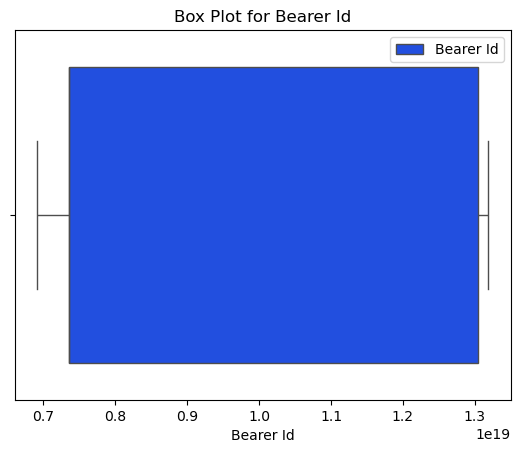

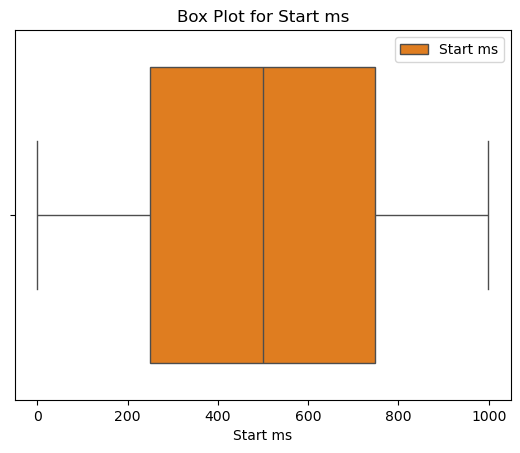

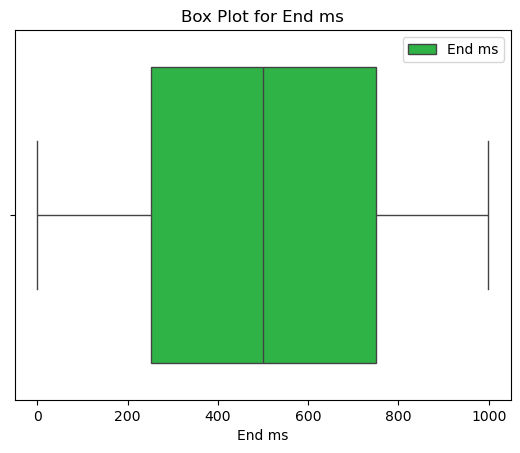

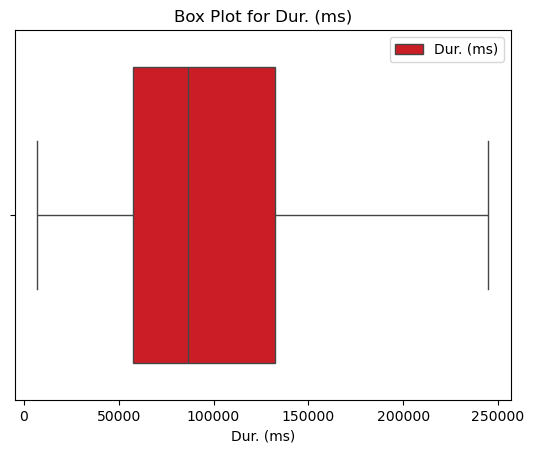

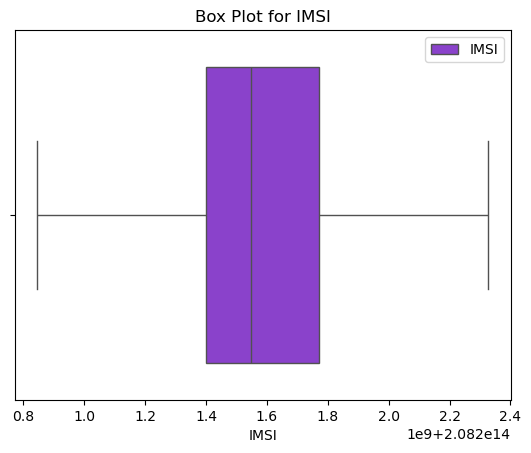

...

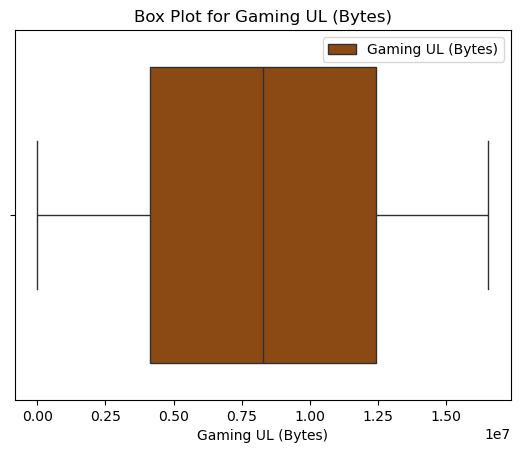

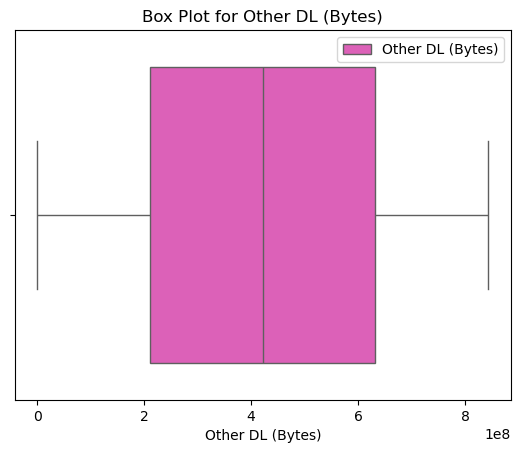

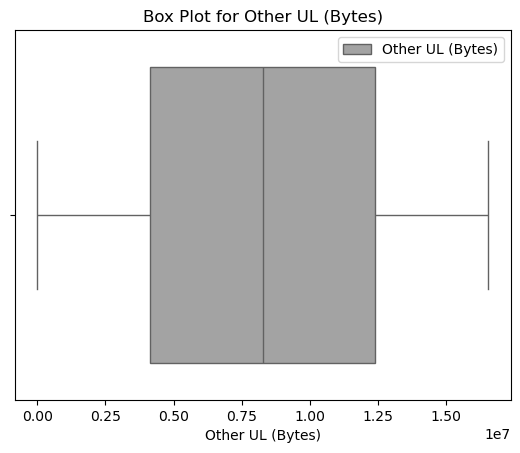

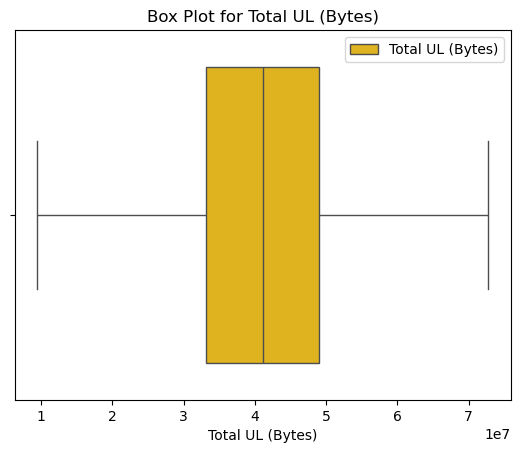

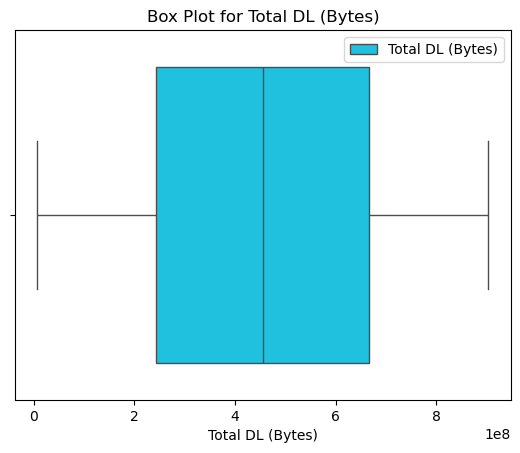

In [35]:
# After capping outliers checking through boxplot 
numeric_columns = df1.select_dtypes(include=['number']).columns

colors = sns.color_palette("bright", len(numeric_columns))

for i, column in enumerate(numeric_columns):
    plt.figure()
    sns.boxplot(x=df1[column], color=colors[i])
    plt.legend([column], loc='upper right')
    plt.title(f'Box Plot for {column}')
    plt.show()

In [36]:
#After capping, we checked using a box plot, and the outliers have been successfully capped.

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🎯 User Overview Analysis 🎯</b></div>

## 1 Identifying The Top 10 Handsets Used By The Customers

In [37]:
df2 = df1.copy()
df1 = df1[["Handset Manufacturer", "Handset Type"]]
handset_counts = df1.groupby(["Handset Manufacturer", "Handset Type"]).size().reset_index(name="Usage Count")
top_handsets = handset_counts.sort_values(by="Usage Count", ascending=False)
top_10 = top_handsets.head(10)
print(top_10)

     Handset Manufacturer                  Handset Type  Usage Count
317                Huawei              Huawei B528S-23A        19752
60                  Apple       Apple iPhone 6S (A1688)         9419
56                  Apple        Apple iPhone 6 (A1586)         9023
1396            undefined                     undefined         8987
66                  Apple        Apple iPhone 7 (A1778)         6326
80                  Apple       Apple iPhone Se (A1723)         5187
73                  Apple        Apple iPhone 8 (A1905)         4993
85                  Apple       Apple iPhone Xr (A2105)         4568
958               Samsung  Samsung Galaxy S8 (Sm-G950F)         4520
82                  Apple        Apple iPhone X (A1901)         3813


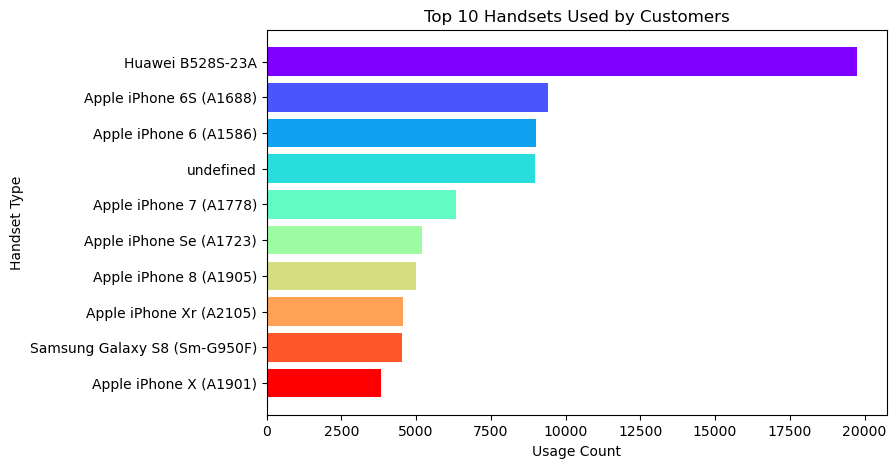

In [38]:
colors = plt.cm.rainbow(np.linspace(0, 1, len(top_10)))

plt.figure(figsize=(8, 5))
plt.barh(top_10["Handset Type"], top_10["Usage Count"], color=colors)
plt.xlabel("Usage Count")
plt.ylabel("Handset Type")
plt.title("Top 10 Handsets Used by Customers")
plt.gca().invert_yaxis()
plt.show()

# Insights

Huawei B528S-23A leads the market–This handset has the highest usage count, indicating a strong preference among customers.

Apple dominates–The majority of top handsets belong to Apple, showcasing their strong brand loyalty and widespread adoption.

Samsung makes an entry–The Samsung Galaxy S8 is the only non-Apple device in the top 10, hinting at its competitive presence.

Undefined category present–One of the entries is marked as undefined, which might indicate data categorization issues or missing information.

Apple’s strong customer retention–Multiple iPhone models appear in the top 10, suggesting that Apple users frequently upgrade but remain within the brand.

Huawei’s surprising lead–The Huawei B528S-23A surpasses iPhone models, indicating a potential market shift toward alternative brands.

Limited competition for Samsung–Despite being a popular Android brand, Samsung has only one model on the list, which suggests Apple’s dominance over Android brands in customer preference.

Data inconsistencies need attention–The presence of an undefined category signals potential gaps in data collection, which could affect analysis accuracy.

Premium Phones Dominate – The list is largely made up of flagship models from Apple and Samsung, suggesting that customers prefer premium devices over budget alternatives.

Older Models Still Popular – Some older smartphones are still widely used, indicating that many customers hold onto their devices for longer periods rather than upgrading frequently.

Strong Brand Loyalty – The presence of multiple Apple iPhone models in the top 10 shows that Apple users tend to stick with the brand when upgrading their devices.

Huawei's Market Presence – The Huawei B528S-23A appearing at the top of the list suggests a strong market share, potentially influenced by regional preferences or affordability.

Potential Data Collection Issues – The occurrence of an "undefined" handset type hints at possible inconsistencies in how device information is recorded, which could impact accurate market analysis.

## 2  Identify The Top 3 Handset Manufacturers

In [39]:
top_3_manufacturers = df2["Handset Manufacturer"].value_counts().head(3).reset_index()
top_3_manufacturers.columns = ["Handset Manufacturer", "Usage Count"]
print(top_3_manufacturers)

  Handset Manufacturer  Usage Count
0                Apple        60137
1              Samsung        40839
2               Huawei        34423


<div style="border-radius:10px; border:gray solid; padding: 15px; background-color: khaki; font-size:100%; text-align:left">
    
<h3 align="left"><font color="brown">📊 Inference:</font></h3>

* Top 3 manufacturers **Apple**,**Samsung** and **Huawei**
</div>

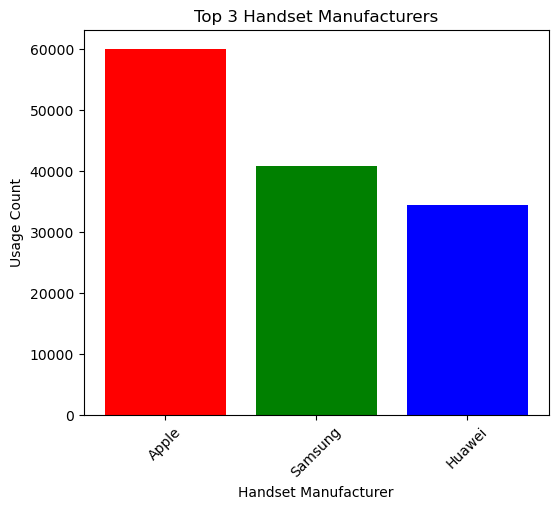

In [40]:
colors = ["red", "green", "blue"] 
plt.figure(figsize=(6, 5))
plt.bar(top_3_manufacturers["Handset Manufacturer"], top_3_manufacturers["Usage Count"], color=colors)
plt.xlabel("Handset Manufacturer")
plt.ylabel("Usage Count")
plt.title("Top 3 Handset Manufacturers")
plt.xticks(rotation=45)
plt.show()

# Insights 

- **Apple dominates the market** – With the highest usage count, Apple maintains its strong presence, showing high customer loyalty and widespread adoption.
  
- **Samsung holds second place** – While not as dominant as Apple, Samsung still has a significant user base, suggesting it is a preferred alternative in the premium smartphone segment.

- **Huawei remains relevant** – Despite facing challenges in certain regions, Huawei's presence in the top 3 indicates continued adoption, possibly due to competitive pricing and strong performance in specific markets.

- **Apple’s sustained market leadership** – Consistent high usage across multiple models proves Apple's success in maintaining customer engagement and driving upgrades.

- **Competition between premium brands** – Samsung and Huawei continue to compete with Apple, with Samsung focusing on flagship devices and Huawei leveraging innovation to attract users.

- **Potential regional variations** – Depending on geographical factors, brand dominance may vary; for instance, Apple leading in North America, while Huawei performs well in Asian markets.

- **Customer retention strategies matter** – Apple users tend to stick within the ecosystem, while Samsung and Huawei aim to attract new customers through pricing and hardware features.

## 3  Identify The Top 5 Handsets Per Top 3 Handset Manufacturer

In [41]:
top_3_manufacturers = df2["Handset Manufacturer"].value_counts().head(3).index.tolist()
df_filtered = df2[df2["Handset Manufacturer"].isin(top_3_manufacturers)]
handset_counts = df_filtered.groupby(["Handset Manufacturer", "Handset Type"]).size().reset_index(name="Usage Count")
top_5_per_manufacturer = handset_counts.groupby("Handset Manufacturer").apply(lambda x: x.nlargest(5, "Usage Count")).reset_index(drop=True)
print("Top 3 Handset Manufacturers:", top_3_manufacturers)
print("\nTop 5 Handsets per Top 3 Manufacturers:")
print(top_5_per_manufacturer)

Top 3 Handset Manufacturers: ['Apple', 'Samsung', 'Huawei']

Top 5 Handsets per Top 3 Manufacturers:
   Handset Manufacturer                    Handset Type  Usage Count
0                 Apple         Apple iPhone 6S (A1688)         9419
1                 Apple          Apple iPhone 6 (A1586)         9023
2                 Apple          Apple iPhone 7 (A1778)         6326
3                 Apple         Apple iPhone Se (A1723)         5187
4                 Apple          Apple iPhone 8 (A1905)         4993
5                Huawei                Huawei B528S-23A        19752
6                Huawei                    Huawei E5180         2079
7                Huawei  Huawei P20 Lite Huawei Nova 3E         2021
8                Huawei                      Huawei P20         1480
9                Huawei                  Huawei Y6 2018          997
10              Samsung    Samsung Galaxy S8 (Sm-G950F)         4520
11              Samsung      Samsung Galaxy A5 Sm-A520F         3724
12

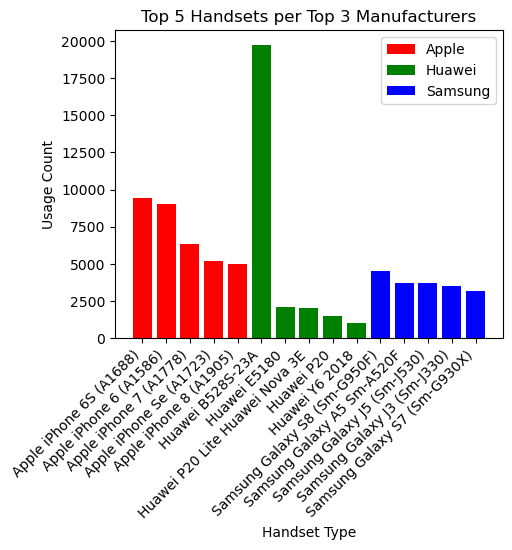

In [42]:
colors = {"Apple": "red", "Samsung": "blue", "Huawei": "green"}
plt.figure(figsize=(5, 4))
for manufacturer in top_5_per_manufacturer["Handset Manufacturer"].unique():
    subset = top_5_per_manufacturer[top_5_per_manufacturer["Handset Manufacturer"] == manufacturer]
    plt.bar(subset["Handset Type"], subset["Usage Count"], color=colors[manufacturer], label=manufacturer)

plt.xlabel("Handset Type")
plt.ylabel("Usage Count")
plt.title("Top 5 Handsets per Top 3 Manufacturers")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.show()

# Insights 

1️⃣ **Apple's Steady Popularity** – Apple’s handsets show consistent usage counts, ranging between **5000–8000**, indicating steady demand across multiple iPhone models.

2️⃣ **Huawei’s Market Strength** – Huawei's **E5180 model** dominates with nearly **20,000 usage counts**, suggesting it is a widely adopted device among customers.

3️⃣ **Samsung’s Balanced Distribution** – Samsung handsets have a more evenly spread usage count (**2500–5000 range**), implying diversified customer preferences within its lineup.

4️⃣ **Competitive Landscape** – Each manufacturer has at least **one standout model**, showing that customers are divided across major brands rather than favoring just one.

5️⃣ **Older Models Still in Use** – Devices such as the **iPhone 6S and iPhone 7** remain widely used, indicating that users prefer keeping older models longer rather than frequently upgrading.  

✅ **Brand Loyalty Patterns** – Apple’s consistent handset presence reflects strong brand loyalty among its users, with a preference for older iPhone models.

✅ **Huawei's Regional Strength** – The high usage count of Huawei handsets suggests that the brand holds strong in certain regions despite global challenges.

✅ **Premium vs Budget Phones** – Samsung and Apple handsets dominate the list, showing that customers primarily favor well-known premium brands.

✅ **Longer Device Lifespan** – Users are **holding onto older devices longer**, particularly with iPhone models, rather than upgrading annually.    

### Number Of xDR Sessions 

In [43]:
num_xdr_sessions = df2["Bearer Id"].nunique()
print(f"Number of xDR sessions: {num_xdr_sessions}")

Number of xDR sessions: 9


### total download (DL) and upload (UL) data   

In [44]:
total_dl_data = df2["Total DL (Bytes)"].sum()
total_ul_data = df2["Total UL (Bytes)"].sum()

print(f"Total Download Data: {total_dl_data} Bytes")
print(f"Total Upload Data: {total_ul_data} Bytes")

print(f"Total Download Data: {total_dl_data / (1024**3):.2f} GB")
print(f"Total Upload Data: {total_ul_data / (1024**3):.2f} GB")

Total Download Data: 68196970352922.5 Bytes
Total Upload Data: 6168221257466.5 Bytes
Total Download Data: 63513.38 GB
Total Upload Data: 5744.60 GB


In [45]:
applications = [
    "Social Media DL (Bytes)", "Social Media UL (Bytes)",
    "Google DL (Bytes)", "Google UL (Bytes)",
    "Email DL (Bytes)", "Email UL (Bytes)",
    "Youtube DL (Bytes)", "Youtube UL (Bytes)",
    "Netflix DL (Bytes)", "Netflix UL (Bytes)",
    "Gaming DL (Bytes)", "Gaming UL (Bytes)",
    "Other DL (Bytes)", "Other UL (Bytes)"
]
total_data_per_app = df2[applications].sum()
print(total_data_per_app)
total_data_per_app_gb = total_data_per_app / (1024**3)  
print("Total Data per Application in GB:")
print(total_data_per_app_gb)

Social Media DL (Bytes)    2.693001e+11
Social Media UL (Bytes)    4.939298e+09
Google DL (Bytes)          8.626186e+11
Google UL (Bytes)          3.084833e+11
Email DL (Bytes)           2.687611e+11
Email UL (Bytes)           7.010648e+10
Youtube DL (Bytes)         1.745123e+12
Youtube UL (Bytes)         1.651423e+12
Netflix DL (Bytes)         1.744039e+12
Netflix UL (Bytes)         1.650274e+12
Gaming DL (Bytes)          6.330713e+13
Gaming UL (Bytes)          1.243268e+12
Other DL (Bytes)           6.316550e+13
Other UL (Bytes)           1.239728e+12
dtype: float64
Total Data per Application in GB:
Social Media DL (Bytes)      250.805226
Social Media UL (Bytes)        4.600080
Google DL (Bytes)            803.376216
Google UL (Bytes)            287.297504
Email DL (Bytes)             250.303300
Email UL (Bytes)              65.291751
Youtube DL (Bytes)          1625.271989
Youtube UL (Bytes)          1538.007082
Netflix DL (Bytes)          1624.263250
Netflix UL (Bytes)          153

In [46]:
df2["Total Duration (ms)"] = df2.groupby("IMSI")["Dur. (ms)"].transform("sum")
df2["Decile Class"] = pd.qcut(df2["Total Duration (ms)"], q=10, labels=False) + 1 
top_deciles = df2[df2["Decile Class"] >= 6]
decile_data = top_deciles.groupby("Decile Class")[["Total DL (Bytes)", "Total UL (Bytes)"]].sum()
decile_data["Total Data (Bytes)"] = decile_data["Total DL (Bytes)"] + decile_data["Total UL (Bytes)"]
print(decile_data)

              Total DL (Bytes)  Total UL (Bytes)  Total Data (Bytes)
Decile Class                                                        
6                 6.807642e+12      6.166131e+11        7.424255e+12
7                 6.817935e+12      6.166737e+11        7.434609e+12
8                 6.783968e+12      6.173499e+11        7.401318e+12
9                 6.782830e+12      6.151308e+11        7.397960e+12
10                6.831804e+12      6.162538e+11        7.448058e+12


## Graphical Univariate Analysis


 mu = 422044702.60 and sigma = 243966681.13



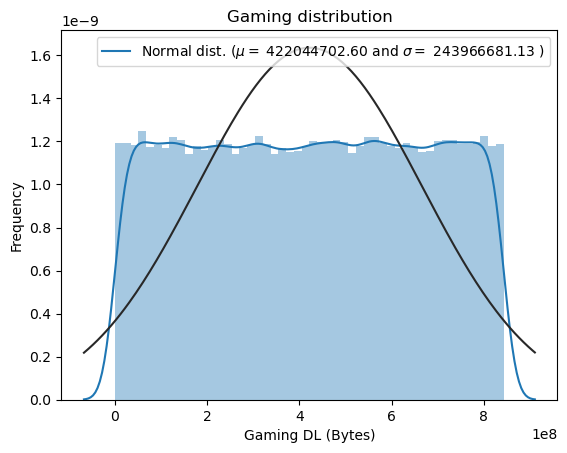

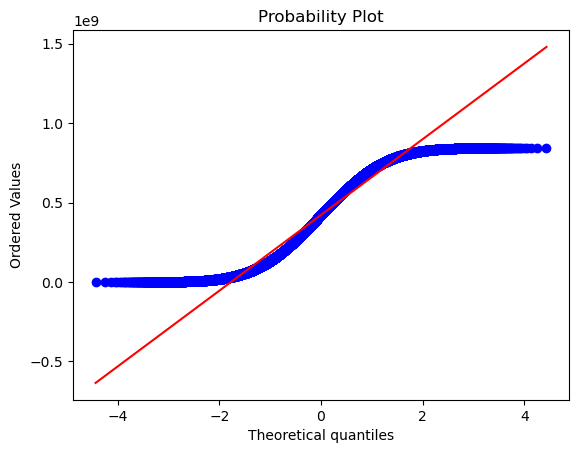

In [47]:
sns.distplot(df2['Gaming DL (Bytes)'] , fit=norm);
(mu, sigma) = norm.fit(df2['Gaming DL (Bytes)'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Gaming distribution')
fig = plt.figure()
res = stats.probplot(df2['Gaming DL (Bytes)'], plot=plt)
plt.show()

## Insights From Gaming distribution

- **Data Distribution:** The histogram suggests a relatively uniform spread of "Gaming DL (Bytes)" data, meaning there isn't a single dominant peak.

- **Normal Distribution Fit:** The overlaid normal distribution curve does not align well with the histogram, implying that the data does not follow a typical bell-shaped distribution.

- **Statistical Summary:** The mean (μ) is about **422 million bytes**, and the standard deviation (σ) is **243 million bytes**, indicating a broad dispersion of values.

- **Peak Observation:** The normal curve reaches its highest point at the mean, but the histogram itself does not show a distinct peak in the same manner.

## Insights From Probability plot

- **Deviation from Normality:** The blue points form an S-shaped curve, suggesting the data may not perfectly follow a normal distribution.
  
- **Tail Behavior:** The points deviate from the red line at the tails, indicating possible skewness or heavy tails in the dataset.
  
- **Central Fit:** The middle portion of the data aligns closely with the red line, meaning the central values are somewhat normally distributed.
  
- **Potential Distribution Issues:** Since the data strays from normality in certain sections, additional statistical tests may be needed to confirm whether a normal model is appropriate.


 mu = 11626851.72 and sigma = 6725195.61



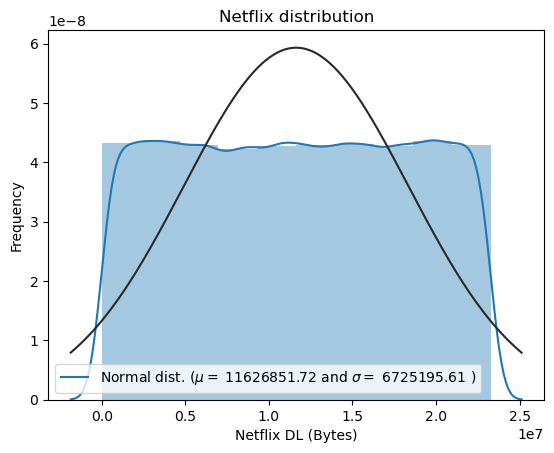

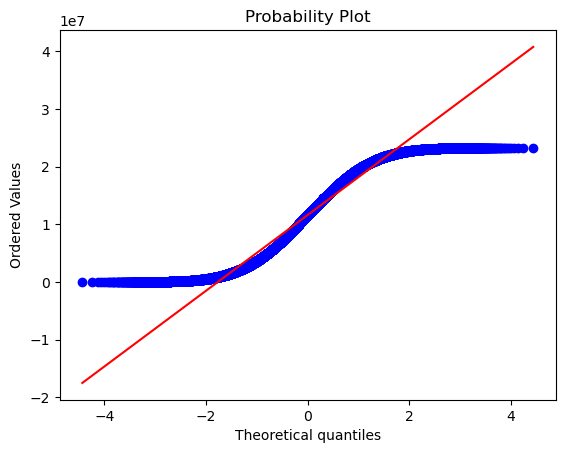

In [48]:
sns.distplot(df2['Netflix DL (Bytes)'] , bins = 10, fit=norm);
(mu, sigma) = norm.fit(df2['Netflix DL (Bytes)'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Netflix distribution')
fig = plt.figure()
res = stats.probplot(df2['Netflix DL (Bytes)'], plot=plt)
plt.show()

## Insights from Netflix distribution

- **Data Distribution:** The blue shaded area represents the actual distribution of Netflix downloads, and it appears to have a somewhat **right-skewed shape**, meaning there are more small download sizes and fewer extremely large ones.
  
- **Normality Comparison:** The overlaid black curve represents a normal distribution with a **mean (μ) of ~11.6 million bytes** and **standard deviation (σ) of ~6.7 million bytes**. However, the actual histogram does not perfectly follow the normal curve, suggesting the data may not be truly normal.

- **Peak and Spread:** The central peak suggests a concentration of download sizes around the mean, but the right tail shows a gradual decrease, hinting at occasional large download sizes.

- **Potential Distribution Fit:** Given the skewness, a normal distribution may not be the best representation, and an alternative distribution (e.g., log-normal or gamma) could better fit the data.

## Insights from Probability Plot

- **Normality Check:** The blue points closely follow the red line, suggesting that the data is approximately **normally distributed**.
  
- **Tail Behavior:** There is **some deviation at the tails**, indicating minor departures from a perfect normal distribution.

- **Scale of Values:** The ordered values range from approximately **-2 to 4**, with a scale factor of **1e7**—meaning the dataset involves values in the **tens of millions**.


 mu = 99572606.75 and sigma = 59084118.13



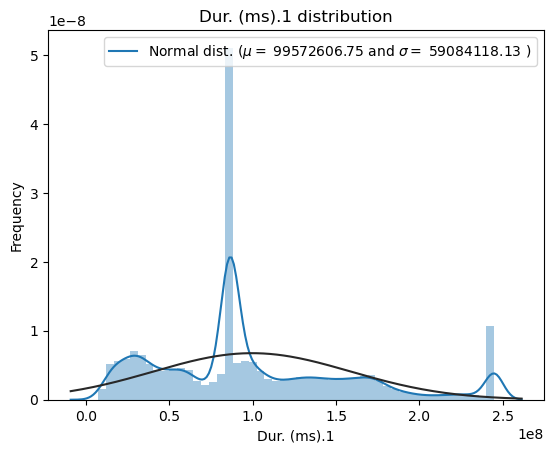

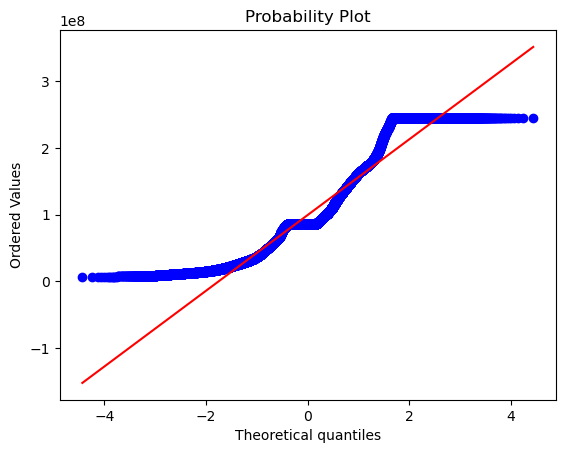

In [49]:
sns.distplot(df2['Dur. (ms).1'] , fit=norm);
(mu, sigma) = norm.fit(df2['Dur. (ms).1'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Dur. (ms).1 distribution')
fig = plt.figure()
res = stats.probplot(df2['Dur. (ms).1'], plot=plt)
plt.show()

## Insights from Dur. (ms).1

- **Mean & Spread:** The average duration is **99,572,606.75 ms**, with a standard deviation of **59,084,118.13 ms**—suggesting a wide spread in values.
  
- **Peaks in Data:** The histogram displays **multiple peaks**, indicating that the data is not strictly normally distributed.

- **High Frequency Area:** There is a noticeable peak around **1e8 ms**, meaning a large number of durations cluster near this value.

- **Variability Observed:** The presence of several smaller peaks suggests potential subcategories or different patterns within the dataset.

## Insights from Probability Plot

- **Deviation from Normality:** The blue points diverge significantly from the red line, suggesting that the data does **not** follow a normal distribution.

- **Step-like Pattern:** The ordered values display a stair-step effect, which might indicate **discrete data** rather than a continuous distribution.

- **Wide Value Range:** The dataset spans approximately **3e8**, meaning there’s a **broad spread** in the distribution.

## Bivariate Analysis

In [50]:
biv_data = df2[['Social Media DL (Bytes)', 'Google DL (Bytes)', 'Email DL (Bytes)',
               'Youtube DL (Bytes)', 'Netflix DL (Bytes)', 'Gaming DL (Bytes)',
               'Total DL (Bytes)', 'Other DL (Bytes)']]
totals = biv_data.sum(numeric_only=True)  
biv_data.loc['totals'] = totals
print(biv_data.tail())

        Social Media DL (Bytes)  Google DL (Bytes)  Email DL (Bytes)  \
149997             2.344568e+06       2.229420e+06      1.954414e+06   
149998             1.245845e+06       3.850890e+06      1.525734e+06   
149999             8.015470e+05       4.189773e+06      2.228270e+06   
150000             1.795322e+06       5.750753e+06      1.791729e+06   
totals             2.693001e+11       8.626186e+11      2.687611e+11   

        Youtube DL (Bytes)  Netflix DL (Bytes)  Gaming DL (Bytes)  \
149997        1.387723e+07        1.935015e+07       6.268931e+08   
149998        2.266051e+07        9.963942e+06       5.535395e+08   
149999        8.817106e+06        3.322253e+06       3.525370e+08   
150000        1.163407e+07        1.162685e+07       4.220447e+08   
totals        1.745123e+12        1.744039e+12       6.330713e+13   

        Total DL (Bytes)  Other DL (Bytes)  
149997      6.666488e+08      7.121804e+08  
149998      5.927864e+08      1.211009e+08  
149999      3.718

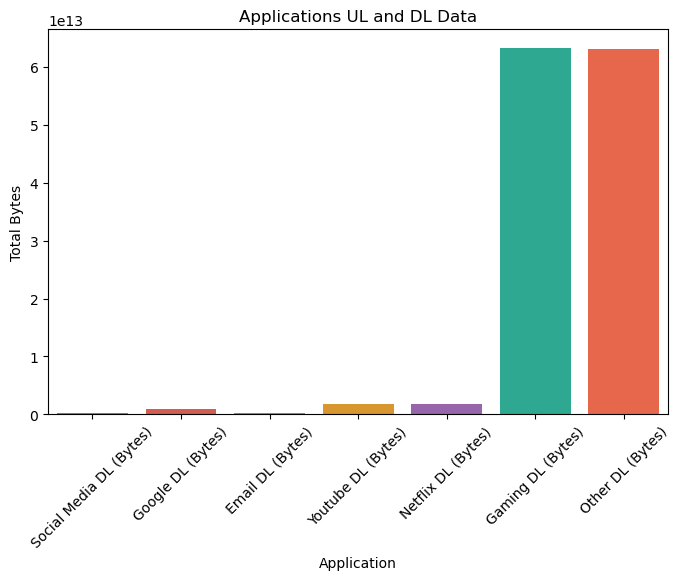

In [51]:
a = biv_data.tail(1)
long_df = pd.melt(a)
long_df = long_df.drop([6], axis=0)
colors = ["#3498db", "#e74c3c", "#2ecc71", "#f39c12", "#9b59b6", "#1abc9c", "#ff5733", "#8e44ad"]
plt.figure(figsize=(8,5))
sns.barplot(x=long_df.variable, y=long_df.value, palette=colors)
plt.title("Applications UL and DL Data")
plt.xlabel("Application")
plt.ylabel("Total Bytes")
plt.xticks(rotation=45)  
plt.show()

## Insights from plot

1. **Gaming and Other Categories Dominate Data Usage**  
   - *Gaming DL (bytes)* and *Other DL (bytes)* have significantly **higher total downloads**, reaching nearly **6 x 10^13 bytes**.
   - This suggests that gaming-related applications and miscellaneous downloads consume the most bandwidth.

2. **Lower Data Consumption in Other Applications**  
   - *Social Media DL*, *Google DL*, *Email DL*, *YouTube DL*, and *Netflix DL* have **considerably lower data downloads**.
   - This indicates that these applications might have **lighter data consumption patterns**, or users interact with them differently than gaming-related apps.

3. **Possible Usage Patterns**  
   - The disparity in data downloads suggests that gaming and "Other" applications might include **heavy data transactions**, such as large file downloads, updates, or streaming.
   - On the other hand, **social media and email apps** may involve smaller, frequent data exchanges rather than large downloads.

### **1. Download vs Upload Disparity**
- **Netflix, YouTube, and Gaming** show **significantly higher downloads** compared to their upload values.
- This suggests users consume a lot of content but **generate very little upload traffic**—which is expected for streaming-heavy platforms.

### **2. Social Media and Google Data Usage**
- **Social Media and Google** have a more **balanced DL and UL pattern**, indicating frequent two-way interactions (e.g., messaging, file sharing, searches).
- This could mean users actively post, share media, and engage in uploads more than just consuming content.

### **3. “Other” Category Consumes Major Data**
- The **“Other DL (Bytes)”** category has extremely high data consumption.
- This suggests there might be unidentified **large-scale downloads**—potentially system updates, cloud backups, or background applications consuming significant bandwidth.

### **4. Gaming Data Behavior**
- **Gaming UL (Bytes)** is **comparatively higher than other apps**, implying **real-time multiplayer interactions** or game patches involve substantial uploads.

### **5. Network Optimization Implications**
- If **Netflix, YouTube, and Gaming** dominate downloads, **bandwidth allocation** should favor high-capacity streaming and gaming users.
- **Social media and search engines** might need **low-latency network settings** for better real-time interaction.

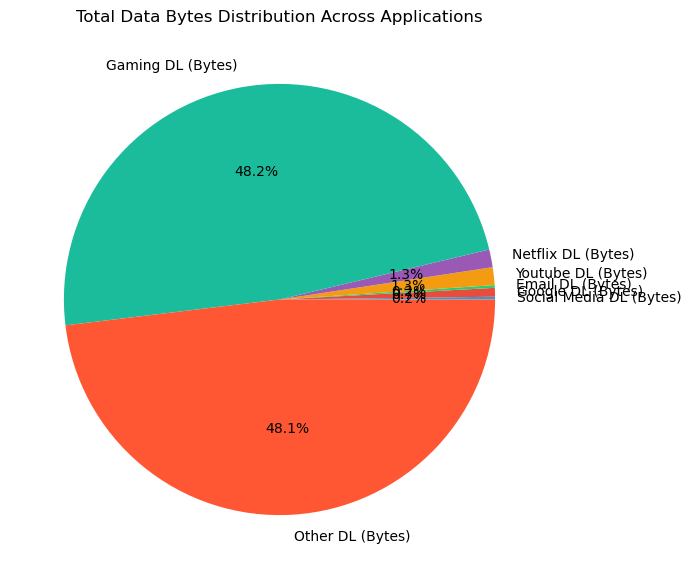

In [52]:
biv_data = df2[['Social Media DL (Bytes)', 'Google DL (Bytes)', 'Email DL (Bytes)',
               'Youtube DL (Bytes)', 'Netflix DL (Bytes)', 'Gaming DL (Bytes)',
               'Total DL (Bytes)', 'Other DL (Bytes)']]
totals = biv_data.sum(numeric_only=True)  
biv_data.loc['totals'] = totals  
long_df = pd.melt(biv_data.tail(1))
if 6 in long_df.index:
    long_df = long_df.drop([6], axis=0)
colors = ["#3498db", "#e74c3c", "#2ecc71", "#f39c12", "#9b59b6", "#1abc9c", "#ff5733", "#8e44ad"]
a = biv_data.drop(['Total DL (Bytes)'], axis=1)
fig = plt.figure(figsize=(10, 7))
plt.pie(a.loc['totals'], labels=a.columns, autopct="%1.1f%%", colors=colors)
plt.title("Total Data Bytes Distribution Across Applications")
plt.show()

## Insights

1. **Gaming and Other DL Dominate Data Usage**  
   - *Gaming DL (Bytes)* accounts for **48.2%** and *Other DL (Bytes)* for **48.1%**, showing that these categories consume nearly all the bandwidth.
   - The "Other DL" category suggests unidentified large data transactions—possibly system updates, cloud backups, or miscellaneous downloads.

2. **Minimal Data Consumption for Streaming & Social Media**  
   - *Netflix DL (Bytes)* and *YouTube DL (Bytes)* each account for **only 1.3%**, meaning streaming services contribute far less compared to gaming.
   - *Social Media DL (Bytes)* has the smallest share at **0.4%**, implying that social platforms use significantly less data compared to entertainment apps.

3. **Potential Implications for Network Optimization**  
   - Since *Gaming* and *Other* data categories dominate, **network bandwidth allocation** should prioritize these use cases.
   - *Social Media, Email, and Search platforms* require **low-latency configurations** instead of high-bandwidth allocation.

In [53]:
df2.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes),Total Duration (ms),Decile Class
0,1.311450e+19,2019-04-04 12:01:00,770.0,2019-04-25 14:35:00,662.0,244912.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16457E+15,42.0,5.0,23.0,44.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,37624.0,38787.0,244913628.0,Samsung,Samsung Galaxy A5 Sm-A520F,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0,489824.0,9
1,1.311450e+19,2019-04-09 13:04:00,235.0,2019-04-25 08:15:00,606.0,244912.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,65.0,5.0,16.0,26.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,168.0,3560.0,244913628.0,Samsung,Samsung Galaxy J5 (Sm-J530),971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0,489824.0,9
2,1.311450e+19,2019-04-09 17:42:00,1.0,2019-04-25 11:58:00,652.0,244912.0,2.082008e+14,3.373042e+10,3.528151e+13,D42335A,45.0,5.0,6.0,9.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,244913628.0,Samsung,Samsung Galaxy A8 (2018),751.0,695.0,1684053.0,42224.0,8535055.0,1694064.0,2690151.0,672973.0,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0,952915787.0,10
3,1.311450e+19,2019-04-10 00:31:00,486.0,2019-04-25 07:36:00,171.0,244912.0,2.082014e+14,3.373042e+10,3.535661e+13,T21824A,45.0,5.0,44.0,44.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,3330.0,37882.0,244913628.0,undefined,undefined,17.0,207.0,644121.0,13372.0,9023734.0,2788027.0,1439754.0,631229.0,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0,244912.0,7
4,1.311450e+19,2019-04-12 20:10:00,565.0,2019-04-25 10:40:00,954.0,244912.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,45.0,5.0,6.0,9.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,244913628.0,Samsung,Samsung Sm-G390F,607.0,604.0,862600.0,50188.0,6248284.0,1500559.0,1936496.0,173853.0,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0,244912.0,7


### Scatter plot showing relationship between Total DL (Bytes) and Email DL (Bytes)

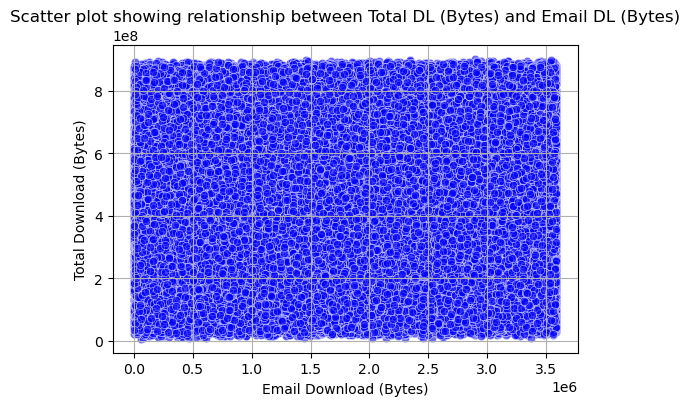

In [54]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data=df2, x='Email DL (Bytes)', y='Total DL (Bytes)', alpha=0.6, color="blue")
plt.title("Scatter plot showing relationship between Total DL (Bytes) and Email DL (Bytes)")
plt.xlabel("Email Download (Bytes)")
plt.ylabel("Total Download (Bytes)")
plt.grid(True)  
plt.show()

# Insights

### **1. Weak or No Clear Correlation**
- The data points are **widely dispersed** with no apparent pattern, suggesting that **Email DL (Bytes) does not significantly influence Total DL (Bytes)**.
- There is **no strong upward or downward trend**, meaning email downloads do not contribute meaningfully to overall data consumption.

### **2. Uniform Distribution**
- The scatter points are **densely packed across the plot**, suggesting that email downloads remain **consistent across various levels of total downloads**.
- This could imply that users **regularly download emails**, but these downloads **do not fluctuate drastically across the dataset**.

### **4. Implications for Network Analysis**
- Since email downloads seem **minimally related** to total downloads, network providers can prioritize **high-bandwidth allocation** for data-heavy applications like gaming and streaming instead of focusing on email traffic.
- **Further analysis (correlation or regression) could help quantify the relationship**, but visually, the impact of email downloads on total data usage appears **weak**.

### Scatter plot showing relationship between Total DL (Bytes) and Google DL (Bytes)

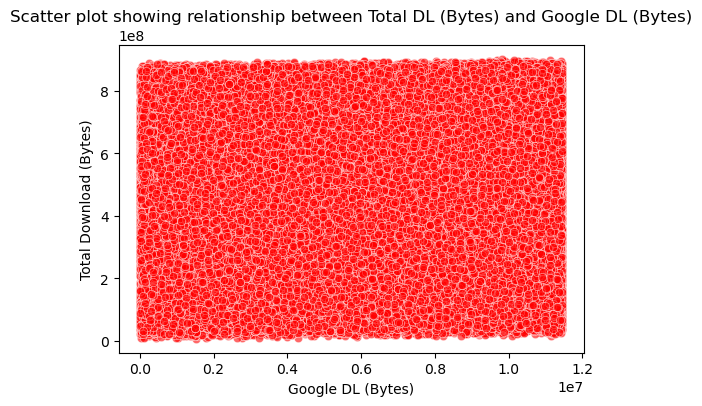

In [55]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data=df2, x='Google DL (Bytes)', y='Total DL (Bytes)', alpha=0.6, color="red")
plt.title("Scatter plot showing relationship between Total DL (Bytes) and Google DL (Bytes)")
plt.xlabel("Google DL (Bytes)")  
plt.ylabel("Total Download (Bytes)")  
plt.show()

# Insights

1. **Positive Correlation Between Google DL & Total DL**  
   - The scatter plot shows **a dense clustering of points**, indicating a **strong correlation** between Google downloads and total data usage.  
   - As **Google DL (Bytes) increases**, **Total DL (Bytes) also increases**, suggesting users who download a lot via Google tend to have high total downloads.

2. **Wide Distribution of Data Points**  
   - The points **spread across the entire plot**, meaning users have **varying download behaviors**—some rely heavily on Google downloads, while others have relatively lower usage.

3. **Outliers in High-Usage Range**  
   - A few **extreme values** appear, indicating instances where **Google DL data spikes**, significantly contributing to total download consumption.  
   - These may be related to **large file downloads, updates, or bulk data transfers** from Google services.

### **Network Optimization Implications**  
- **Heavy Google users contribute significantly to overall network load**—service providers may need to **allocate bandwidth accordingly**.  
- Users with **higher Google DL traffic tend to have a generally high data consumption** across multiple applications.  

## Scatter plot showing relationship between Total DL (Bytes) and Gaming DL (Bytes)

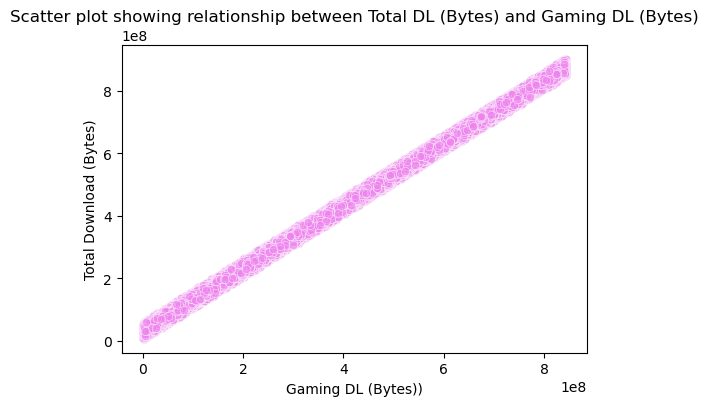

In [56]:
plt.figure(figsize=(6, 4))
sns.scatterplot(data=df2, x='Gaming DL (Bytes)', y='Total DL (Bytes)', alpha=0.6, color="violet")
plt.title("Scatter plot showing relationship between Total DL (Bytes) and Gaming DL (Bytes)")
plt.xlabel("Gaming DL (Bytes))")  
plt.ylabel("Total Download (Bytes)")  
plt.show()

# Insights

1. **Strong Positive Correlation Between Gaming DL & Total DL**  
   - The data points form a **linear pattern**, indicating a **strong relationship** between Gaming Download (Bytes) and Total Download (Bytes).
   - As **Gaming Download increases**, **Total Download also increases proportionally**, suggesting gaming traffic significantly contributes to overall data consumption.

2. **Gaming as a Major Contributor to Total DL**  
   - Since the trend is **consistently upward**, gaming **is likely a significant factor** in overall bandwidth usage.
   - High gaming downloads suggest users frequently download **game updates, patches, or interact in multiplayer gaming environments**.  
  
- As **Google DL (Bytes) increases, Total DL (Bytes) also increases**, meaning that users with higher Google-related downloads contribute significantly to overall network consumption.  
- This suggests that Google services (Drive, Search, Play Store downloads) play a major role in total data usage.  
  
- The **density of high-value points** implies that users who download large amounts from Google tend to have **higher total data usage** across all applications.  
- If Google data usage is high, chances are these users also consume **significant data from streaming, gaming, or other sources**. 

## Variable Transformations

In [57]:
df2['Decile_rank'] = pd.qcut(df['Dur. (ms).1'], 5, labels = False) 
new_df = df2[['Decile_rank', 'Total DL (Bytes)']]
a = new_df.groupby('Decile_rank').sum()
a

,Total DL (Bytes)
Decile_rank,
0,1.364976e+13
1,1.368736e+13
2,1.355137e+13
3,1.362235e+13
4,1.368615e+13


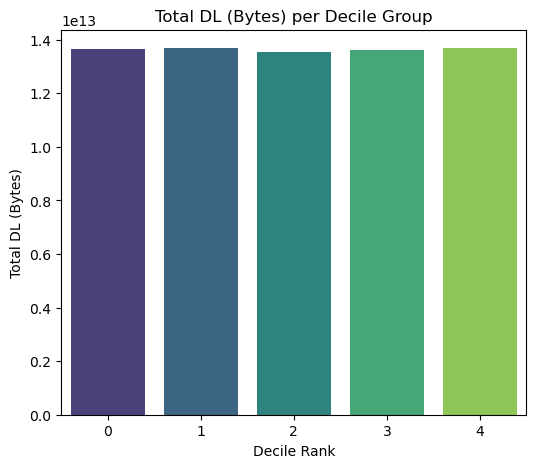

In [58]:
plt.figure(figsize=(6,5))
sns.barplot(x=a.index, y=a['Total DL (Bytes)'], palette="viridis")
plt.title('Total DL (Bytes) per Decile Group')
plt.ylabel('Total DL (Bytes)')
plt.xlabel('Decile Rank')
plt.show()

## Correlation Analysis

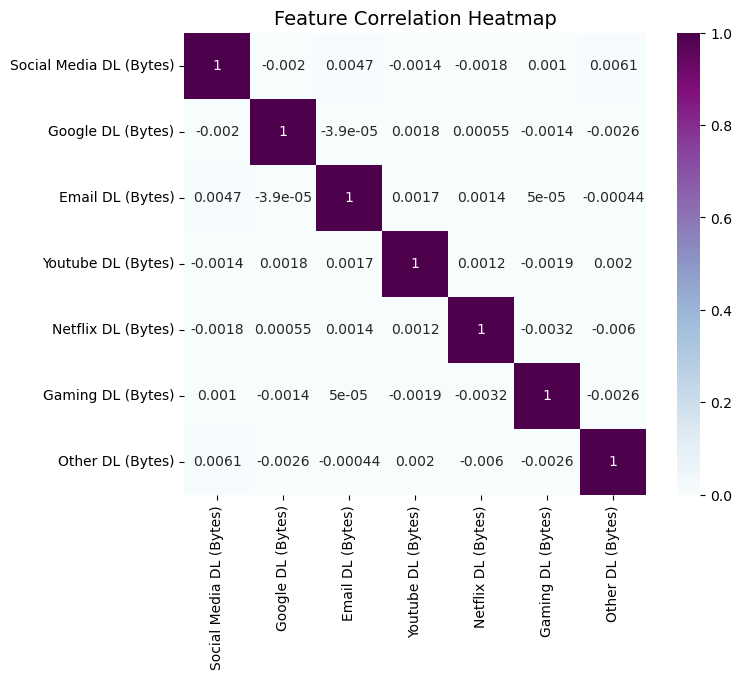

In [59]:
corr_data = df2[['Social Media DL (Bytes)', 'Google DL (Bytes)', 'Email DL (Bytes)', 
                'Youtube DL (Bytes)', 'Netflix DL (Bytes)', 'Gaming DL (Bytes)', 'Other DL (Bytes)']]
corr = corr_data.corr()
f_fig, f_ax = plt.subplots(figsize=(8,6))
sns.heatmap(corr, vmin=0, vmax=1, square=True, annot=True, annot_kws={"size": 10}, cmap="BuPu", ax=f_ax)
plt.title("Feature Correlation Heatmap", fontsize=14)
plt.show()

# Insights

### **1️⃣ Weak Correlation Across Features**
- The correlation coefficients are **close to zero**, indicating **weak or no linear relationship** between different types of data usage.
- This suggests that users consuming **Netflix data** might not necessarily be heavy **YouTube or Social Media users**, and vice versa.

### **2️⃣ Slight Positive Relationships**
- The **strongest positive correlation** observed is between **Social Media DL and Other DL** (**0.0061**).  
  - This means users who heavily download **social media content** may also consume **other types of data**.
- Other correlations, like **Gaming DL vs Netflix DL**, are minimal.

### **3️⃣ Weak Negative Correlation**
- The **highest negative correlation** is between **Google DL and Other DL** (**-0.0026**).  
  - This indicates that heavy **Google data consumers** might use less **general "Other DL" content**.

### **4️⃣ No Strong Usage Pattern**
- No features show **high correlation (> 0.7)**, meaning there is **no distinct trend** linking various types of downloads.  
- This suggests that users consume content independently of other categories.

## Dimensionality Reduction

In [60]:
new_numerical = []
for col in df2.columns:
    if df2[col].dtype in [ 'int64','float64']:
        new_numerical.append(col)
seg = df2[new_numerical].copy()
seg = seg.drop(['MSISDN/Number'], axis=1)  
scaler = StandardScaler()
scaled_data = scaler.fit_transform(seg)

In [61]:
scaled_data.shape

(150001, 42)

In [62]:
pca = PCA()
pca.fit(scaled_data)

PCA()

In [63]:
pca.explained_variance_ratio_

array([2.34602650e-01, 7.33710523e-02, 4.76693731e-02, 4.74533543e-02,
       3.68088049e-02, 3.18511386e-02, 2.96110052e-02, 2.67035923e-02,
       2.41930536e-02, 2.41149305e-02, 2.40354770e-02, 2.39699858e-02,
       2.38990151e-02, 2.38430163e-02, 2.37874840e-02, 2.37734469e-02,
       2.36943887e-02, 2.35582636e-02, 2.35313581e-02, 2.34814714e-02,
       2.28199773e-02, 2.09175491e-02, 2.06762808e-02, 1.90305363e-02,
       1.80748955e-02, 1.71019902e-02, 1.51863013e-02, 1.20099328e-02,
       9.67461045e-03, 8.59462027e-03, 6.62404992e-03, 4.13925426e-03,
       2.86745698e-03, 2.61900172e-03, 2.47677701e-03, 1.57305573e-03,
       6.25484879e-04, 6.12896338e-04, 4.21892522e-04, 5.74730396e-07,
       1.90944167e-12, 4.12929358e-13])

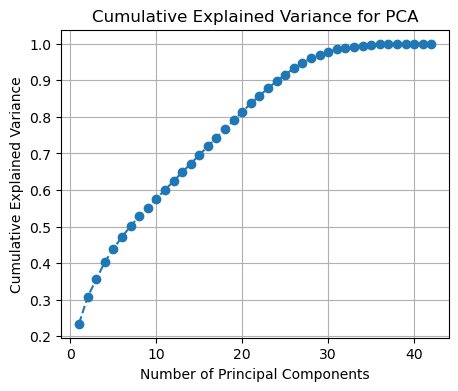

In [64]:
plt.figure(figsize=(5, 4))
plt.plot(range(1, len(seg.columns) + 1), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.title("Cumulative Explained Variance for PCA")
plt.show()

In [65]:
optimal_components = np.argmax(pca.explained_variance_ratio_.cumsum() > 0.90) + 1 
pca = PCA(n_components=optimal_components)
pca.fit(scaled_data)

PCA(n_components=25)

In [66]:
pca_scores = pca.transform(scaled_data)

In [67]:
a = pd.DataFrame(pca_scores)
a['MSISDN/Number'] = df2['MSISDN/Number']
a.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,MSISDN/Number
0,-2.879206,3.328300,-0.466588,-0.881200,-0.308119,0.075174,-0.109633,1.035867,-0.453193,0.789735,0.368571,-0.871645,0.532362,-0.324513,0.413214,-0.029049,-1.854309,0.401224,-2.198850,0.763953,1.125357,0.288947,-0.455299,0.325819,-0.353391,3.366496e+10
1,-2.552519,3.340601,0.237258,1.967624,-1.102588,-0.008290,-0.023176,-0.336730,0.934625,-0.813372,-1.641454,-1.625810,-1.807595,0.209229,-0.102463,1.129550,-0.368396,-0.724867,0.361974,-1.100806,0.718414,-0.797212,-0.741489,0.926750,0.631083,3.368185e+10
2,-2.926503,3.765114,-0.135358,-1.936870,3.327138,-0.087536,0.596464,-0.948413,-0.277511,-0.028752,-1.792681,0.048296,0.680563,0.926281,0.234563,0.904372,0.097674,0.686835,1.138631,-0.561187,0.138584,-1.636443,-0.526044,0.370858,-0.035583,3.373042e+10
3,-2.873484,3.032691,1.857387,1.331088,-0.531382,0.033278,-0.164701,-0.769978,0.869825,-0.719902,0.159750,1.219529,-0.613112,2.424827,0.611132,1.569564,0.058507,-0.058520,-0.041277,0.062329,0.882155,0.838045,-0.300435,0.578724,-0.748751,3.373042e+10
4,-2.787469,3.063168,0.720786,0.033546,-0.535813,0.053637,-0.249469,1.322484,1.181763,0.303696,-1.399596,1.453497,-0.718325,-0.121733,0.325854,1.731093,-1.193387,0.203419,0.456564,-0.395233,0.276432,-0.967288,-0.652910,0.531857,-0.761565,3.369980e+10


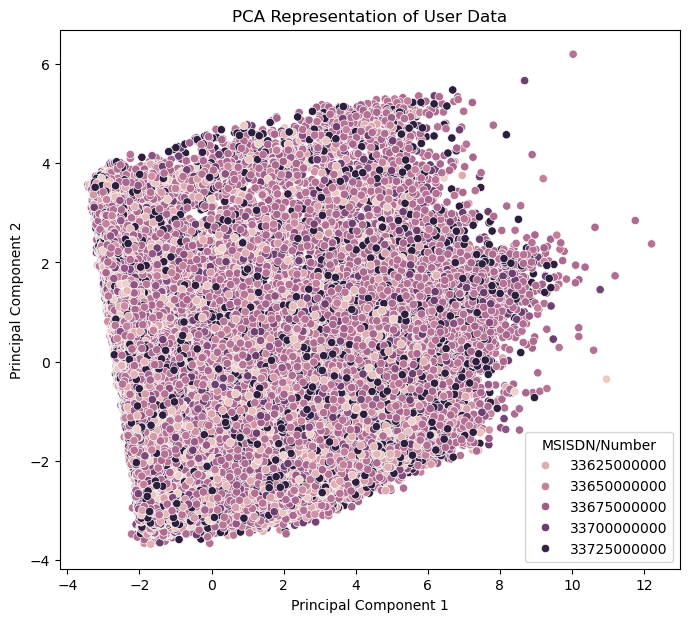

In [68]:
plt.figure(figsize=(8, 7))
sns.scatterplot(x=a.iloc[:, 0], y=a.iloc[:, 1], hue=a['MSISDN/Number'])
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Representation of User Data")
plt.show()

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🎯 User Engagement Analysis 🎯</b></div>

## Sessions frequency, sessions duration, sessions total traffic

In [69]:
df2['Total_bytes'] = df2['Total DL (Bytes)'] + df2['Total UL (Bytes)']
user_data = df2[['MSISDN/Number', 'Total_bytes', 'Dur. (ms).1', 'Bearer Id']]

In [70]:
agg_user_data = user_data.groupby('MSISDN/Number').agg({'Bearer Id':'count', 'Dur. (ms).1':'sum',  'Total_bytes': 'sum'})
agg_user_data.columns = ['sessions_freq', 'sessions_duration(ms)', 'sessions_traffic(bytes)']
agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes)
MSISDN/Number,,,
3.360416e+10,1631,1.578704e+11,8.098334e+11
3.360417e+10,1,5.892230e+07,5.723161e+08
3.360417e+10,2,2.129908e+08,9.682418e+08
3.360418e+10,1,1.273675e+08,7.534301e+08
3.360418e+10,1,4.512601e+07,2.723432e+08


### Top 10 users with high sessions frequency

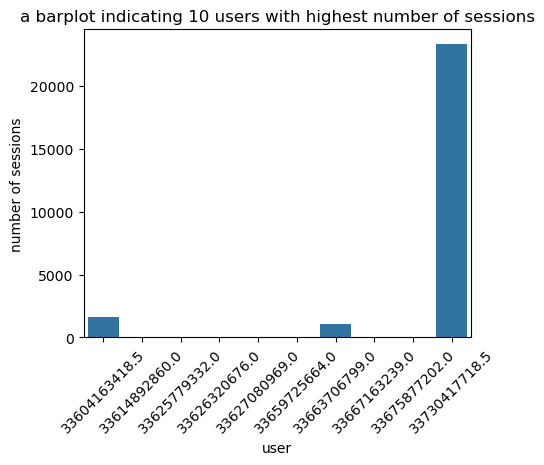

In [71]:
a = agg_user_data.sort_values(by = 'sessions_freq', ascending = False).head(10)
plt.figure(figsize = (5,4))
sns.barplot(x = a.index, y = a['sessions_freq'])
plt.ylabel('number of sessions')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest number of sessions')
plt.show()

### Top 10 users with high sessions traffic

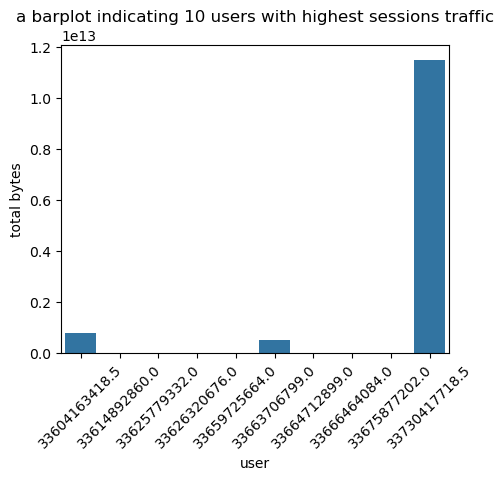

In [72]:
b = agg_user_data.sort_values(by = 'sessions_traffic(bytes)', ascending = False).head(10)
plt.figure(figsize = (5,4))
sns.barplot(x = b.index, y = b['sessions_traffic(bytes)'])
plt.ylabel('total bytes')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest sessions traffic')
plt.show()

### Top 10 users with longest sessions duration

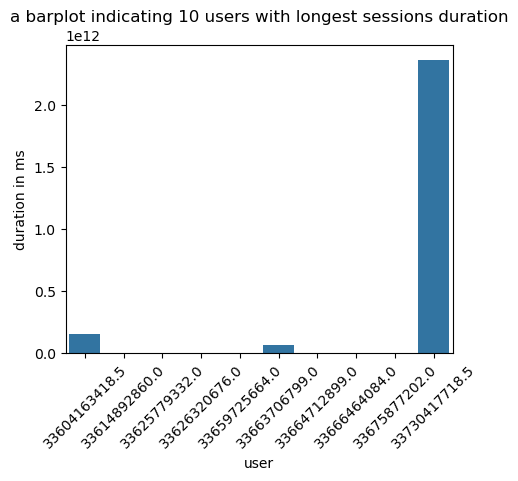

In [73]:
c = agg_user_data.sort_values(by = 'sessions_duration(ms)', ascending = False).head(10)
plt.figure(figsize = (5,4))
sns.barplot(x = b.index, y = b['sessions_duration(ms)'])
plt.ylabel('duration in ms')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with longest sessions duration')
plt.show()

In [74]:
a = a.index.to_list()
b = b.index.to_list()
c = c.index.to_list()

def IntersecOfSets(arr1, arr2, arr3): 
    s1 = set(arr1) 
    s2 = set(arr2) 
    s3 = set(arr3) 

    set1 = s1.intersection(s2)
    result_set = set1.intersection(s3) 
      
    final_list = list(result_set) 
    print(final_list) 
  
IntersecOfSets(a, b, c) 

[33659725664.0, 33625779332.0, 33626320676.0, 33663706799.0, 33675877202.0, 33730417718.5, 33604163418.5, 33614892860.0]


### Normalize each engagement metric and run a k-means (k=3) to classify customers in three groups of engagement


In [75]:
numeric_cols = agg_user_data.drop(columns=['Cluster'], errors='ignore') 
norm_agg_user_data = np.log1p(numeric_cols)
print(norm_agg_user_data.head())  

               sessions_freq  sessions_duration(ms)  sessions_traffic(bytes)
MSISDN/Number                                                               
3.360416e+10        7.397562              25.785040                27.420094
3.360417e+10        0.693147              17.891730                20.165202
3.360417e+10        1.098612              19.176760                20.690992
3.360418e+10        0.693147              18.662587                20.440147
3.360418e+10        0.693147              17.624969                19.422574


In [76]:
norm_agg_user_data.shape

(89092, 3)

In [77]:
# kmeans on 3 clusters.
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
kmeans.fit(norm_agg_user_data)
kmeans_data = kmeans.predict(norm_agg_user_data)

In [78]:
norm_agg_user_data['clusters'] = pd.Series(kmeans_data, index=norm_agg_user_data.index)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,7.397562,25.785040,27.420094,0
3.360417e+10,0.693147,17.891730,20.165202,1
3.360417e+10,1.098612,19.176760,20.690992,0
3.360418e+10,0.693147,18.662587,20.440147,0
3.360418e+10,0.693147,17.624969,19.422574,1


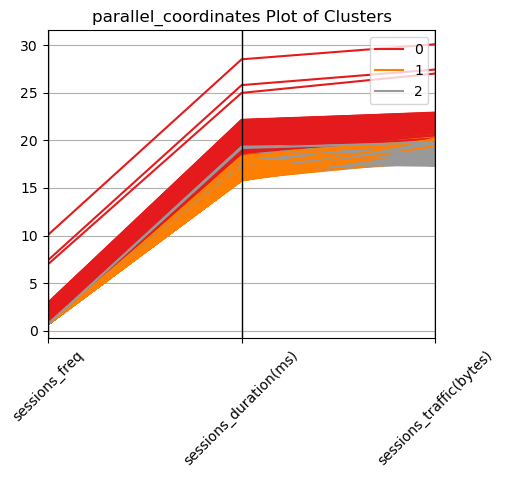

In [79]:
norm_agg_user_data['clusters'] = norm_agg_user_data['clusters'].astype(str)  
plt.figure(figsize=(5, 4))
parallel_coordinates(norm_agg_user_data, class_column='clusters', colormap=plt.get_cmap("Set1"))
plt.xticks(rotation=45)
plt.title("parallel_coordinates Plot of Clusters")
plt.show()

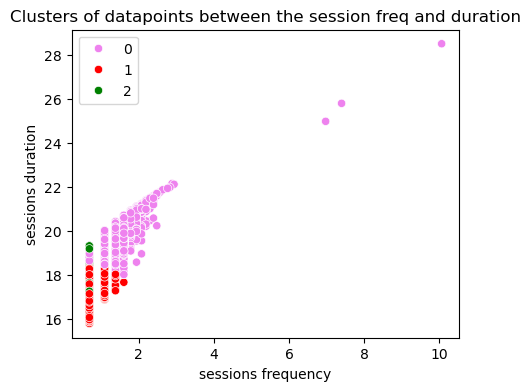

In [80]:
# comparing the clusters in variable pairs
x = norm_agg_user_data[['sessions_freq', 'sessions_duration(ms)', 'clusters']]
plt.figure(figsize = (5,4))
sns.scatterplot(x = norm_agg_user_data['sessions_freq'],  y = norm_agg_user_data['sessions_duration(ms)'], palette = ['violet', 'red', 'green'], hue = norm_agg_user_data['clusters'])
plt.title('Clusters of datapoints between the session freq and duration')
plt.xlabel('sessions frequency')
plt.ylabel('sessions duration')
plt.legend()
plt.show()

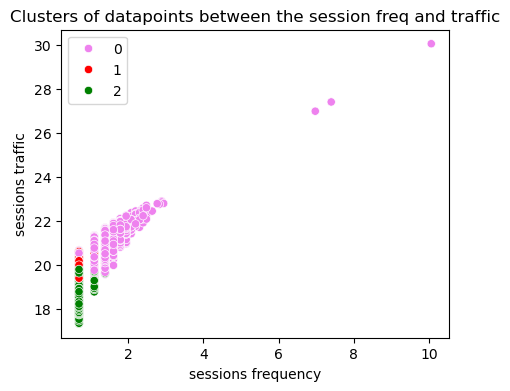

In [81]:
x = norm_agg_user_data[['sessions_freq', 'sessions_traffic(bytes)', 'clusters']]
plt.figure(figsize = (5,4))
sns.scatterplot(x = norm_agg_user_data['sessions_freq'],  y = norm_agg_user_data['sessions_traffic(bytes)'], palette = ['violet', 'red', 'green'], hue = norm_agg_user_data['clusters'])
plt.title('Clusters of datapoints between the session freq and traffic')
plt.xlabel('sessions frequency')
plt.ylabel('sessions traffic')
plt.legend()
plt.show()

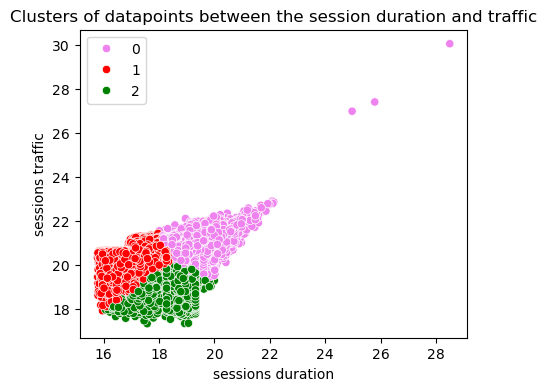

In [82]:
x = norm_agg_user_data[['sessions_duration(ms)', 'sessions_traffic(bytes)', 'clusters']]
plt.figure(figsize = (5,4))
sns.scatterplot(x = norm_agg_user_data['sessions_duration(ms)'],  y = norm_agg_user_data['sessions_traffic(bytes)'], palette = ['violet', 'red', 'green'], hue = norm_agg_user_data['clusters'])
plt.title('Clusters of datapoints between the session duration and traffic')
plt.xlabel('sessions duration')
plt.ylabel('sessions traffic')
plt.legend()
plt.show()

### Compute the minimum, maximum, average & total non- normalized metrics for each cluster. Interpret your results visually with accompanying text 

In [83]:
agg_user_data['clusters'] = kmeans_data
agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,1631,1.578704e+11,8.098334e+11,0
3.360417e+10,1,5.892230e+07,5.723161e+08,1
3.360417e+10,2,2.129908e+08,9.682418e+08,0
3.360418e+10,1,1.273675e+08,7.534301e+08,0
3.360418e+10,1,4.512601e+07,2.723432e+08,1


In [84]:
agg_user_data.clusters.value_counts()

clusters
0    33721
1    31491
2    23880
Name: count, dtype: int64

In [85]:
# cluster 1 (cluster = 0)
cluster_1 = agg_user_data.loc[agg_user_data['clusters'] == 0]              
print(cluster_1.shape)
cluster_1.tail()

(33721, 4)


,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.370000e+10,2,1.727995e+08,1.045252e+09,0
3.370000e+10,1,1.456979e+08,5.931102e+08,0
3.370000e+10,1,1.244457e+08,8.267019e+08,0
3.370000e+10,1,1.716729e+08,8.274129e+08,0
3.373042e+10,23317,2.364128e+12,1.149296e+13,0


In [86]:
cluster_1.describe().T

,count,mean,std,min,25%,50%,75%,max
sessions_freq,33721.0,2.683995e+00,1.274115e+02,1.0,1.0,2.0,2.000000e+00,2.331700e+04
sessions_duration(ms),33721.0,3.085875e+08,1.290810e+10,66595562.0,144797483.0,181818160.0,2.592000e+08,2.364128e+12
sessions_traffic(bytes),33721.0,1.425830e+09,6.280459e+10,282995664.0,682267962.0,871100706.0,1.271147e+09,1.149296e+13
clusters,33721.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.000000e+00


In [87]:
# cluster 2 (cluster = 1)
cluster_2 = agg_user_data.loc[agg_user_data['clusters'] == 1]               
print(cluster_2.shape)
cluster_2.tail()

(31491, 4)


,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.370000e+10,1,10196238.0,264915169.0,1
3.370000e+10,1,86399974.0,582285161.0,1
3.370000e+10,1,86399900.0,680420343.0,1
3.370000e+10,1,9498876.0,584400944.0,1
3.370000e+10,1,66045541.0,481066420.0,1


In [88]:
cluster_2.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,31491.000000,3.149100e+04,3.149100e+04,31491.0
mean,1.108253,5.478148e+07,6.409798e+08,1.0
std,0.313554,2.857785e+07,2.418665e+08,0.0
min,1.000000,7.146574e+06,6.013219e+07,1.0
25%,1.000000,2.823123e+07,4.868157e+08,1.0
50%,1.000000,5.247463e+07,6.379098e+08,1.0
75%,1.000000,8.639985e+07,7.916251e+08,1.0
max,4.000000,1.096755e+08,2.034468e+09,1.0


In [89]:
# cluster 3 (cluster = 2)
cluster_3 = agg_user_data.loc[agg_user_data['clusters'] == 2]                
print(cluster_3.shape)
cluster_3.tail()

(23880, 4)


,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.369999e+10,1,244913628.0,129973102.0,2
3.369999e+10,1,134818012.0,164823680.0,2
3.370000e+10,1,144643611.0,143204761.0,2
3.370000e+10,1,244913628.0,336433505.0,2
3.370000e+10,1,214209016.0,394753492.0,2


In [90]:
cluster_3.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,23880.000000,2.388000e+04,2.388000e+04,23880.0
mean,1.029899,1.174618e+08,2.554300e+08,2.0
std,0.170559,5.148197e+07,1.148072e+08,0.0
min,1.000000,9.599059e+06,3.324901e+07,2.0
25%,1.000000,8.639991e+07,1.567661e+08,2.0
50%,1.000000,1.022710e+08,2.480222e+08,2.0
75%,1.000000,1.487442e+08,3.484701e+08,2.0
max,3.000000,4.839601e+08,5.403886e+08,2.0


### Aggregate user total traffic per application and derive the top 10 most engaged users per application 


In [91]:
print(df2.columns)
df3 = df2[['Social Media DL (Bytes)', 'Netflix DL (Bytes)', 'Youtube DL (Bytes)', 
                   'Google DL (Bytes)', 'Email DL (Bytes)', 'Gaming DL (Bytes)', 
                   'Other DL (Bytes)', 'MSISDN/Number']]
print(df3.tail())

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1',
       'Handset Manufacturer', 'Handset Type', 'Nb of sec with Vol DL < 6250B',
       'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)',
       'Social Media UL (Bytes)', 'Google DL (Bytes)', 'Google UL (Bytes)',
       'Email DL (Bytes)', 'Email UL (Bytes)', 'Youtube DL (Bytes)',
       'Youtube UL (Bytes)', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)',
       'Gaming DL (Bytes)', 'Gaming UL (Bytes)', 'Other DL (Bytes)',


### 10 users with highest social media traffic

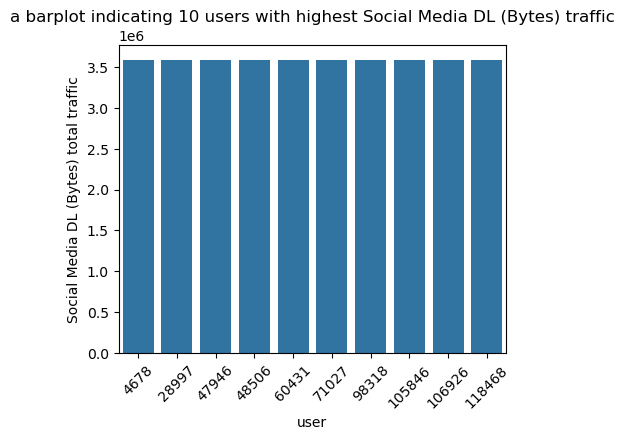

In [92]:
b = df3.sort_values(by = 'Social Media DL (Bytes)', ascending = False).head(10)
plt.figure(figsize = (5,4))
sns.barplot(x = b.index, y = b['Social Media DL (Bytes)'])
plt.ylabel('Social Media DL (Bytes) total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest Social Media DL (Bytes) traffic')
plt.show()

### 10 users with highest netflix traffic

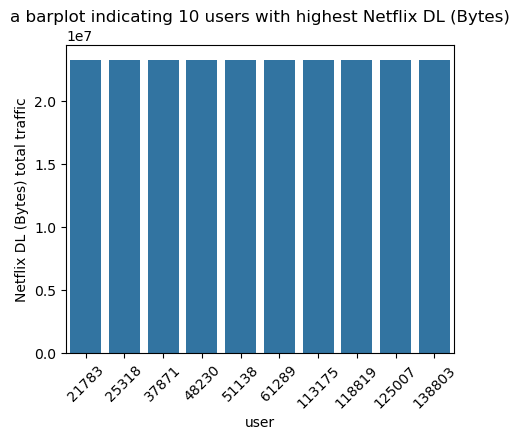

In [93]:
c = df3.sort_values(by = 'Netflix DL (Bytes)', ascending = False).head(10)
plt.figure(figsize = (5,4))
sns.barplot(x = c.index, y = c['Netflix DL (Bytes)'])
plt.ylabel('Netflix DL (Bytes) total traffic')
plt.xlabel('user')
plt.xticks(rotation = 45)
plt.title('a barplot indicating 10 users with highest Netflix DL (Bytes)')
plt.show()

## Plot the top 3 most used applications

In [94]:
top_apps = df3[['Gaming DL (Bytes)', 'Other DL (Bytes)', 'Youtube DL (Bytes)']].sum().sort_values(ascending=False)

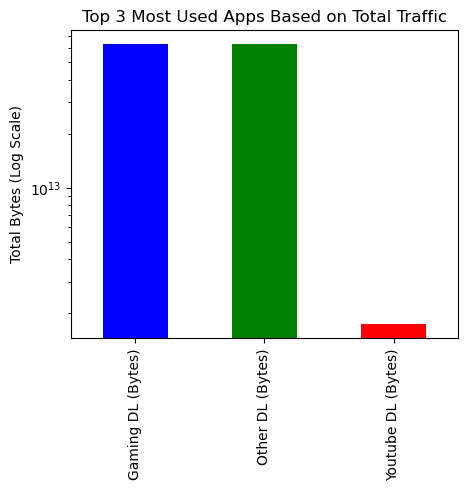

In [95]:
plt.figure(figsize=(5,4))
top_apps.plot(kind='bar', color=['blue', 'green', 'red'])
plt.yscale('log')  
plt.title("Top 3 Most Used Apps Based on Total Traffic")
plt.ylabel("Total Bytes (Log Scale)")
plt.show()

## Using k-means clustering algorithm, group users in k engagement clusters based on the engagement metrics: 

In [96]:
norm_agg_user_data = norm_agg_user_data.drop(['clusters'], axis = 1)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes)
MSISDN/Number,,,
3.360416e+10,7.397562,25.785040,27.420094
3.360417e+10,0.693147,17.891730,20.165202
3.360417e+10,1.098612,19.176760,20.690992
3.360418e+10,0.693147,18.662587,20.440147
3.360418e+10,0.693147,17.624969,19.422574


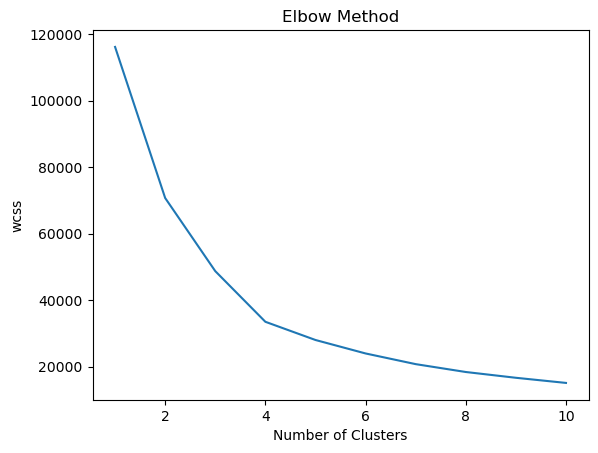

In [97]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    kmeans.fit(norm_agg_user_data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('wcss')
plt.show()

In [98]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=10, random_state=0)
kmeans.fit(norm_agg_user_data)
y_means = kmeans.predict(norm_agg_user_data)
agg_user_data['clusters'] = y_means
agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,1631,1.578704e+11,8.098334e+11,3
3.360417e+10,1,5.892230e+07,5.723161e+08,0
3.360417e+10,2,2.129908e+08,9.682418e+08,3
3.360418e+10,1,1.273675e+08,7.534301e+08,0
3.360418e+10,1,4.512601e+07,2.723432e+08,1


In [99]:
#clusters df3
cluster_1 = agg_user_data[agg_user_data.clusters == 0]
cluster_2 = agg_user_data[agg_user_data.clusters == 1]
cluster_3 = agg_user_data[agg_user_data.clusters == 2]
cluster_4 = agg_user_data[agg_user_data.clusters == 3]

In [100]:
# descriptions
cluster_1.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,39223.000000,3.922300e+04,3.922300e+04,39223.0
mean,1.187008,1.204085e+08,6.796580e+08,0.0
std,0.396472,4.720682e+07,2.260927e+08,0.0
min,1.000000,4.338715e+07,3.296749e+08,0.0
25%,1.000000,8.639992e+07,5.085609e+08,0.0
50%,1.000000,1.039012e+08,6.593735e+08,0.0
75%,1.000000,1.524952e+08,8.093539e+08,0.0
max,4.000000,3.385277e+08,2.034468e+09,0.0


In [101]:
# descriptions
cluster_2.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,16390.000000,1.639000e+04,1.639000e+04,16390.0
mean,1.073276,2.894381e+07,5.524431e+08,1.0
std,0.261766,1.159460e+07,2.612248e+08,0.0
min,1.000000,7.146574e+06,4.604748e+07,1.0
25%,1.000000,1.936639e+07,3.498100e+08,1.0
50%,1.000000,2.820993e+07,5.422293e+08,1.0
75%,1.000000,3.715433e+07,7.420101e+08,1.0
max,3.000000,5.953446e+07,1.789204e+09,1.0


In [102]:
# descriptions
cluster_3.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,17360.000000,1.736000e+04,1.736000e+04,17360.0
mean,1.025576,1.183823e+08,2.068412e+08,2.0
std,0.158236,5.397360e+07,8.066171e+07,0.0
min,1.000000,1.864570e+07,3.324901e+07,2.0
25%,1.000000,8.639985e+07,1.365964e+08,2.0
50%,1.000000,9.910240e+07,2.063993e+08,2.0
75%,1.000000,1.514066e+08,2.769568e+08,2.0
max,3.000000,4.839601e+08,3.576273e+08,2.0


In [103]:
# descriptions
cluster_4.describe()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
count,16119.000000,1.611900e+04,1.611900e+04,16119.0
mean,4.221602,4.766860e+08,2.175176e+09,3.0
std,184.275043,1.866876e+10,9.083432e+10,0.0
min,1.000000,6.659556e+07,2.970946e+08,3.0
25%,2.000000,2.017225e+08,9.608055e+08,3.0
50%,2.000000,2.619900e+08,1.251920e+09,3.0
75%,3.000000,3.530325e+08,1.624918e+09,3.0
max,23317.000000,2.364128e+12,1.149296e+13,3.0


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🎯 Experience Analytics 🎯</b></div>

<div style="border-radius:10px; border:gray solid; padding: 15px; background-color: khaki; font-size:100%; text-align:left">
    
<h3 align="left"><font color="brown">📊 Inference:</font></h3>

*Aggregate, per customer, the following information (treat missing & outliers by replacing by the mean or the mode of the corresponding variable)
Average TCP retransmission
Average RTT
Handset type
Average throughput
</div>

In [104]:
# Identify numeric and categorical columns
numeric_cols = df2[["MSISDN/Number","Avg RTT DL (ms)", "Avg RTT UL (ms)", "Avg Bearer TP DL (kbps)", "Avg Bearer TP UL (kbps)", 
                "DL TP < 50 Kbps (%)", "UL TP < 10 Kbps (%)","Handset Type"]]
print("Aggregation completed successfully!")

Aggregation completed successfully!


In [105]:
numeric_cols.head()

,MSISDN/Number,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),UL TP < 10 Kbps (%),Handset Type
0,3.366496e+10,42.0,5.0,23.0,44.0,100.0,100.0,Samsung Galaxy A5 Sm-A520F
1,3.368185e+10,65.0,5.0,16.0,26.0,100.0,100.0,Samsung Galaxy J5 (Sm-J530)
2,3.373042e+10,45.0,5.0,6.0,9.0,100.0,100.0,Samsung Galaxy A8 (2018)
3,3.373042e+10,45.0,5.0,44.0,44.0,100.0,100.0,undefined
4,3.369980e+10,45.0,5.0,6.0,9.0,100.0,100.0,Samsung Sm-G390F


In [106]:
# null values and Outliers are already treated

In [107]:
# generate total columns for rtt, tp
numeric_cols['total_tp(kbps)'] = df2['Avg Bearer TP DL (kbps)'] + df2['Avg Bearer TP UL (kbps)']
numeric_cols['total_rtt(ms)'] = df2['Avg RTT DL (ms)'] + df2['Avg RTT UL (ms)']
numeric_cols['total_tpl(kbps)'] = df2['DL TP < 50 Kbps (%)'] + df2['UL TP < 10 Kbps (%)']
numeric_cols.head()

,MSISDN/Number,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),UL TP < 10 Kbps (%),Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps)
0,3.366496e+10,42.0,5.0,23.0,44.0,100.0,100.0,Samsung Galaxy A5 Sm-A520F,67.0,47.0,200.0
1,3.368185e+10,65.0,5.0,16.0,26.0,100.0,100.0,Samsung Galaxy J5 (Sm-J530),42.0,70.0,200.0
2,3.373042e+10,45.0,5.0,6.0,9.0,100.0,100.0,Samsung Galaxy A8 (2018),15.0,50.0,200.0
3,3.373042e+10,45.0,5.0,44.0,44.0,100.0,100.0,undefined,88.0,50.0,200.0
4,3.369980e+10,45.0,5.0,6.0,9.0,100.0,100.0,Samsung Sm-G390F,15.0,50.0,200.0


In [108]:
# aggregating
# handset type
a = numeric_cols[['MSISDN/Number', 'Handset Type']]
b = a.groupby('MSISDN/Number').count()
print(b.shape)
b = b.reset_index()
b.head()

(89092, 1)


,MSISDN/Number,Handset Type
0,3.360416e+10,1631
1,3.360417e+10,1
2,3.360417e+10,2
3,3.360418e+10,1
4,3.360418e+10,1


In [109]:
#Drop handset type column
c = numeric_cols.drop(['Handset Type'], axis = 1)
d = c.groupby('MSISDN/Number').sum()
d = d.reset_index()
print(d.shape)
d.head()

(89092, 10)


,MSISDN/Number,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),UL TP < 10 Kbps (%),total_tp(kbps),total_rtt(ms),total_tpl(kbps)
0,3.360416e+10,78806.5,9885.0,12735168.5,796677.0,156588.0,162287.0,13531845.5,88691.5,318875.0
1,3.360417e+10,45.0,5.0,25.0,47.0,100.0,100.0,72.0,50.0,200.0
2,3.360417e+10,118.0,11.0,46253.0,1193.0,186.0,198.0,47446.0,129.0,384.0
3,3.360418e+10,78.0,5.0,23.0,44.0,100.0,100.0,67.0,83.0,200.0
4,3.360418e+10,65.0,5.0,183.0,43.0,100.0,100.0,226.0,70.0,200.0


In [110]:
# Merging them
net_data = pd.merge(left=b, right=d, how='left', left_on='MSISDN/Number', right_on='MSISDN/Number')
print(net_data.shape)
net_data.head()

(89092, 11)


,MSISDN/Number,Handset Type,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),UL TP < 10 Kbps (%),total_tp(kbps),total_rtt(ms),total_tpl(kbps)
0,3.360416e+10,1631,78806.5,9885.0,12735168.5,796677.0,156588.0,162287.0,13531845.5,88691.5,318875.0
1,3.360417e+10,1,45.0,5.0,25.0,47.0,100.0,100.0,72.0,50.0,200.0
2,3.360417e+10,2,118.0,11.0,46253.0,1193.0,186.0,198.0,47446.0,129.0,384.0
3,3.360418e+10,1,78.0,5.0,23.0,44.0,100.0,100.0,67.0,83.0,200.0
4,3.360418e+10,1,65.0,5.0,183.0,43.0,100.0,100.0,226.0,70.0,200.0


 ## Compute & list 10 of the top, bottom, and most frequent:  
a. TCP values in the dataset.   
b. RTT values in the dataset.  
c. Throughput values in the dataset.  

In [111]:
#tpl
column_name = "total_tpl(kbps)" if "total_tpl(kbps)" in net_data.columns else "total_tpl(kbps)"
rtt = net_data.sort_values(by=column_name, ascending=False)
top_rtt = rtt[column_name].head(10)
bottom_rtt = rtt[column_name].tail(10)
fre_rtt = net_data[column_name].value_counts(ascending=False).head(10)
print('Top tpl:\n', top_rtt.to_list())
print('Bottom tpl:\n', bottom_rtt.to_list())
print('Most frequent tpl values:\n', fre_rtt.index.to_list())

Top tpl:
 [4511262.5, 318875.0, 204397.5, 3556.0, 3356.5, 3304.5, 2993.5, 2808.5, 2559.0, 2378.0]
Bottom tpl:
 [175.0, 175.0, 175.0, 175.0, 175.0, 175.0, 175.0, 175.0, 175.0, 175.0]
Most frequent tpl values:
 [200.0, 400.0, 175.0, 176.5, 199.0, 198.0, 175.5, 197.0, 375.0, 196.0]


In [112]:
#rtt
column_name = "total_rtt(ms)" if "total_rtt(ms)" in net_data.columns else "total_rtt(ms)"
rtt = net_data.sort_values(by=column_name, ascending=False)
top_rtt = rtt[column_name].head(10)
bottom_rtt = rtt[column_name].tail(10)
fre_rtt = net_data[column_name].value_counts(ascending=False).head(10)
print('Top rtt:\n', top_rtt.to_list())
print('Bottom rtt:\n', bottom_rtt.to_list())
print('Most frequent rtt values:\n', fre_rtt.index.to_list())

Top rtt:
 [1408603.0, 88691.5, 79239.5, 1132.0, 1048.5, 971.0, 956.0, 903.0, 893.5, 841.5]
Bottom rtt:
 [10.0, 9.0, 9.0, 8.0, 6.0, 5.0, 4.0, 2.0, 0.0, 0.0]
Most frequent rtt values:
 [50.0, 29.0, 125.5, 100.0, 39.0, 38.0, 30.0, 40.0, 28.0, 49.0]


In [113]:
#tp
column_name = "total_tp(kbps)" if "total_tp(kbps)" in net_data.columns else "total_tp(kbps)"
rtt = net_data.sort_values(by=column_name, ascending=False)
top_rtt = rtt[column_name].head(10)
bottom_rtt = rtt[column_name].tail(10)
fre_rtt = net_data[column_name].value_counts(ascending=False).head(10)
print('Top tp:\n', top_rtt.to_list())
print('Bottom tp:\n', bottom_rtt.to_list())
print('Most frequent tp values:\n', fre_rtt.index.to_list())

Top tp:
 [294917395.0, 15015428.5, 13531845.5, 415173.5, 373213.5, 359979.0, 327369.0, 318223.0, 313339.0, 311640.0]
Bottom tp:
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Most frequent tp values:
 [51940.0, 15.0, 63.0, 97.0, 90.0, 98.0, 99.0, 96.0, 89.0, 95.0]


In [114]:
column_name = "total_tpl(bytes)" if "total_tpl(bytes)" in net_data.columns else "total_tpl(kbps)"
a = net_data.sort_values(by=column_name, ascending=False).head(10)
b = net_data.sort_values(by=column_name, ascending=False).tail(10)
c = pd.DataFrame(net_data[column_name].value_counts(ascending=False).head(10))

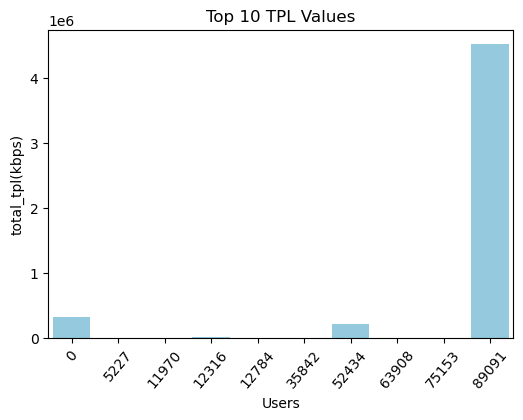

In [115]:
column_name = "total_tpl(bytes)" if "total_tpl(bytes)" in net_data.columns else "total_tpl(kbps)"
top_users = net_data.sort_values(by=column_name, ascending=False).head(10)
plt.figure(figsize=(6, 4))
plt.xticks(rotation=50)
sns.barplot(x=top_users.index, y=top_users[column_name], color="skyblue")
plt.title("Top 10 TPL Values")
plt.xlabel("Users")
plt.ylabel(column_name)
plt.show()

In [116]:
# rtt
column_name = "total_rtt(ms)" if "total_rtt(ms)" in net_data.columns else "total_rtt(ms)"
a = net_data.sort_values(by=column_name, ascending=False).head(10)
b = net_data.sort_values(by=column_name, ascending=False).tail(10)
c = pd.DataFrame(net_data[column_name].value_counts(ascending=False).head(10))

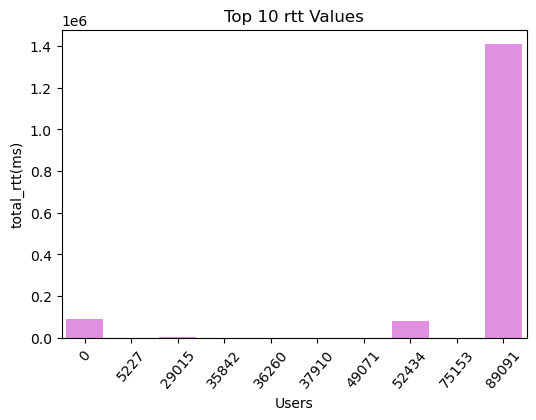

In [117]:
# top 10
column_name = "total_rtt(ms)" if "total_rtt(ms)" in net_data.columns else "total_rtt(ms)"
top_users = net_data.sort_values(by=column_name, ascending=False).head(10)
plt.figure(figsize=(6, 4))
plt.xticks(rotation=50)
sns.barplot(x=top_users.index, y=top_users[column_name], color="violet")
plt.title("Top 10 rtt Values")
plt.xlabel("Users")
plt.ylabel(column_name)
plt.show()

In [118]:
# tp
column_name = "total_tp(kbps)" if "total_tp(kbps)" in net_data.columns else "total_tp(kbps)"
a = net_data.sort_values(by=column_name, ascending=False).head(10)
b = net_data.sort_values(by=column_name, ascending=False).tail(10)
c = pd.DataFrame(net_data[column_name].value_counts(ascending=False).head(10))

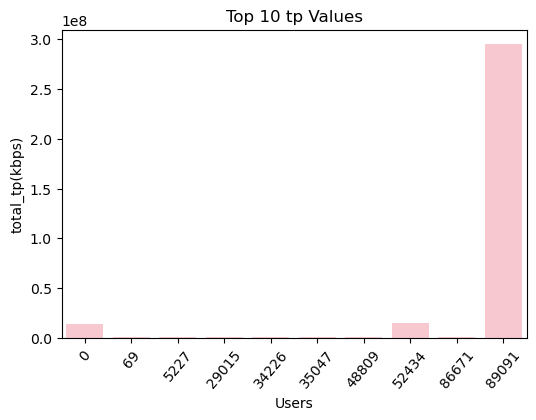

In [119]:
# top 10
column_name = "total_tp(kbps)" if "total_tp(kbps)" in net_data.columns else "total_tp(kbps)"
top_users = net_data.sort_values(by=column_name, ascending=False).head(10)
plt.figure(figsize=(6, 4))
plt.xticks(rotation=50)
sns.barplot(x=top_users.index, y=top_users[column_name], color="pink")
plt.title("Top 10 tp Values")
plt.xlabel("Users")
plt.ylabel(column_name)
plt.show()

## Compute & report:

In [120]:
net_data['total_tp(kbps)'] = net_data['Avg Bearer TP DL (kbps)'] + net_data['Avg Bearer TP UL (kbps)']
net_data['total_rtt(ms)'] = net_data['Avg RTT DL (ms)'] + net_data['Avg RTT UL (ms)']
net_data['total_tpl(kbps)'] = net_data['DL TP < 50 Kbps (%)'] + net_data['UL TP < 10 Kbps (%)']

handset_data = numeric_cols[['Handset Type', 'total_tp(kbps)', 'total_tpl(kbps)']]
agg_handset_data = handset_data.groupby('Handset Type').mean()
agg_handset_data.columns = ['avg_tp_per_set', 'avg_tcp_per_set']
agg_handset_data.head()

,avg_tp_per_set,avg_tcp_per_set
Handset Type,,
A-Link Telecom I. Cubot A5,23510.0,182.0
A-Link Telecom I. Cubot Note Plus,6699.0,193.0
A-Link Telecom I. Cubot Note S,8937.0,176.5
A-Link Telecom I. Cubot Nova,49760.5,176.0
A-Link Telecom I. Cubot Power,49552.5,182.0


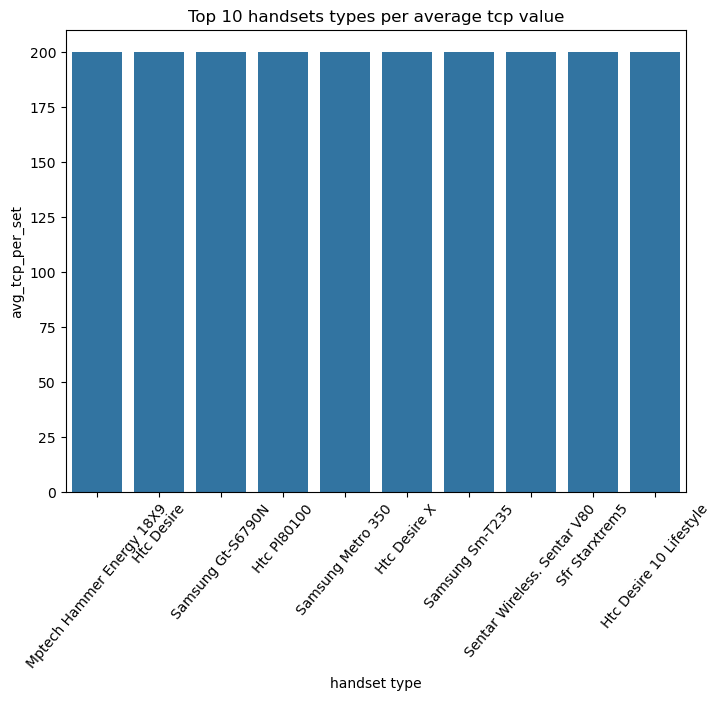

In [121]:
a = agg_handset_data.sort_values(by = 'avg_tcp_per_set', ascending = False).head(10)
plt.figure(figsize = (8,6))
plt.xticks(rotation = 50)
sns.barplot(x = a.index ,y = a['avg_tcp_per_set']).set(title = 'Top 10 handsets types per average tcp value', xlabel = 'handset type')
plt.show()

## Using the experience metrics above, perform a k-means clustering (where k = 3) to segment users into groups of experiences and provide a brief description of each cluster

In [122]:
cluster_data = net_data[['Handset Type', 'total_tp(kbps)', 'total_rtt(ms)',  'total_tpl(kbps)']]
norm_cluster_data = np.log1p(cluster_data)   
norm_cluster_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps)
0,7.397562,16.420556,11.392931,12.672558
1,0.693147,4.290459,3.931826,5.303305
2,1.098612,10.767369,4.867534,5.953243
3,0.693147,4.219508,4.430817,5.303305
4,0.693147,5.424950,4.262680,5.303305


In [123]:
# kmeans on 3 clusters.
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
kmeans.fit(norm_cluster_data)
kmeans_data = kmeans.predict(norm_cluster_data)

In [124]:
cluster_data['clusters'] = pd.Series(kmeans_data, index=cluster_data.index)
cluster_data['clusters'] = pd.Series(kmeans_data, index=cluster_data.index)
cluster_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),clusters
0,1631,13531845.5,88691.5,318875.0,2
1,1,72.0,50.0,200.0,1
2,2,47446.0,129.0,384.0,2
3,1,67.0,83.0,200.0,1
4,1,226.0,70.0,200.0,1


In [125]:
cluster_1 = cluster_data[cluster_data.clusters == 0]
cluster_2 = cluster_data[cluster_data.clusters == 1]
cluster_3 = cluster_data[cluster_data.clusters == 2]

In [126]:
# understand the clusters
cluster_1.describe()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),clusters
count,11896.000000,11896.000000,11896.000000,11896.000000,11896.0
mean,1.376597,3308.043208,87.923294,270.517863,0.0
std,0.716517,2566.900137,44.692259,143.945964,0.0
min,1.000000,351.000000,17.000000,175.000000,0.0
25%,1.000000,967.000000,52.000000,196.000000,0.0
50%,1.000000,2584.000000,87.000000,199.000000,0.0
75%,2.000000,5218.250000,110.000000,392.500000,0.0
max,9.000000,9993.000000,511.000000,1800.000000,0.0


In [127]:
cluster_2.describe()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),clusters
count,45715.000000,45715.000000,45715.000000,45715.000000,45715.0
mean,1.165001,112.314645,55.289828,232.999223,1.0
std,0.435457,68.998703,30.537399,87.091541,0.0
min,1.000000,0.000000,0.000000,197.500000,1.0
25%,1.000000,76.000000,38.000000,200.000000,1.0
50%,1.000000,98.000000,50.000000,200.000000,1.0
75%,1.000000,124.000000,59.000000,200.000000,1.0
max,6.000000,531.000000,448.000000,1200.000000,1.0


In [128]:
cluster_3.describe()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),clusters
count,31481.000000,3.148100e+04,3.148100e+04,3.148100e+04,31481.0
mean,2.552873,5.489662e+04,1.718469e+02,4.835335e+02,2.0
std,131.867450,1.666164e+06,7.966989e+03,2.551392e+04,0.0
min,1.000000,7.738000e+03,1.900000e+01,1.750000e+02,2.0
25%,1.000000,2.216900e+04,6.500000e+01,1.810000e+02,2.0
50%,1.000000,3.853700e+04,9.900000e+01,1.950000e+02,2.0
75%,2.000000,5.194000e+04,1.310000e+02,3.860000e+02,2.0
max,23317.000000,2.949174e+08,1.408603e+06,4.511262e+06,2.0


<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🎯 Satisfaction Analysis 🎯</b></div>

In [129]:
# the results of the 1st clustering
norm_agg_user_data['clusters'] = pd.Series(kmeans_data, index=norm_agg_user_data.index)
norm_agg_user_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),clusters
MSISDN/Number,,,,
3.360416e+10,7.397562,25.785040,27.420094,2
3.360417e+10,0.693147,17.891730,20.165202,1
3.360417e+10,1.098612,19.176760,20.690992,2
3.360418e+10,0.693147,18.662587,20.440147,1
3.360418e+10,0.693147,17.624969,19.422574,1


In [130]:
# Identifying the least engaged cluster
norm_agg_user_data.clusters.value_counts()

clusters
1    45715
2    31481
0    11896
Name: count, dtype: int64

In [131]:
data1 = norm_agg_user_data.drop(['clusters'], axis = 1)
km = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
alldistances = km.fit_transform(data1) 
dist_df = pd.DataFrame(alldistances)
dist_2 = dist_df.iloc[:, 0].to_list() 
print(len(dist_2))
dist_2[:10]

89092


[11.436165057974296,
 1.3678438723893795,
 0.10260930310377249,
 0.605355438175926,
 1.9712755469801198,
 1.881754880729867,
 1.7788102387699571,
 2.807476479758409,
 1.8264956608555198,
 1.8779232860195811]

In [132]:
# add the distances as engagement score column
norm_agg_user_data['engagement_score'] = dist_2
eng_scores_data = norm_agg_user_data.drop(['clusters'], axis = 1)
eng_scores_data.head()

,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),engagement_score
MSISDN/Number,,,,
3.360416e+10,7.397562,25.785040,27.420094,11.436165
3.360417e+10,0.693147,17.891730,20.165202,1.367844
3.360417e+10,1.098612,19.176760,20.690992,0.102609
3.360418e+10,0.693147,18.662587,20.440147,0.605355
3.360418e+10,0.693147,17.624969,19.422574,1.971276


* experience score to each user. Consider the experience score as the Euclidean distance between the user data point & the worst experience’s cluster.

In [133]:
# picking out the 4 cols
exp_data = numeric_cols.drop(['Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 
                          'Avg Bearer TP UL (kbps)', 'DL TP < 50 Kbps (%)', 'UL TP < 10 Kbps (%)'], axis = 1)
exp_data.head()

,MSISDN/Number,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps)
0,3.366496e+10,Samsung Galaxy A5 Sm-A520F,67.0,47.0,200.0
1,3.368185e+10,Samsung Galaxy J5 (Sm-J530),42.0,70.0,200.0
2,3.373042e+10,Samsung Galaxy A8 (2018),15.0,50.0,200.0
3,3.373042e+10,undefined,88.0,50.0,200.0
4,3.369980e+10,Samsung Sm-G390F,15.0,50.0,200.0


In [134]:
agg_exp_data = exp_data.groupby('MSISDN/Number').agg({'Handset Type':'count', 'total_tp(kbps)':'sum', 'total_rtt(ms)':'sum', 'total_tpl(kbps)':'sum'})
agg_exp_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps)
MSISDN/Number,,,,
3.360416e+10,1631,13531845.5,88691.5,318875.0
3.360417e+10,1,72.0,50.0,200.0
3.360417e+10,2,47446.0,129.0,384.0
3.360418e+10,1,67.0,83.0,200.0
3.360418e+10,1,226.0,70.0,200.0


In [135]:
# normalize and perform kmeans
norm_agg_exp_data = np.log1p(agg_exp_data)
norm_agg_exp_data.head()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps)
MSISDN/Number,,,,
3.360416e+10,7.397562,16.420556,11.392931,12.672558
3.360417e+10,0.693147,4.290459,3.931826,5.303305
3.360417e+10,1.098612,10.767369,4.867534,5.953243
3.360418e+10,0.693147,4.219508,4.430817,5.303305
3.360418e+10,0.693147,5.424950,4.262680,5.303305


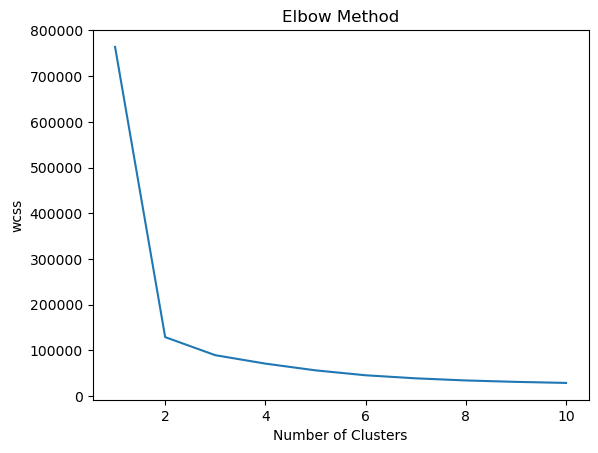

In [136]:
# determining number of clusters using elbow plot
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    kmeans.fit(norm_agg_exp_data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('wcss')
plt.show()

In [137]:
# fit kmeans and identify least engaged cluster
k_means = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
k_means.fit(norm_agg_exp_data)
clusters=k_means.predict(norm_agg_exp_data)

norm_agg_exp_data['clusters'] = clusters
norm_agg_exp_data.clusters.value_counts()

clusters
1    45715
2    31481
0    11896
Name: count, dtype: int64

In [138]:
# fit kmeans
data1 = norm_agg_exp_data.drop(['clusters'], axis = 1)

km = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
alldistances = km.fit_transform(data1) 

dist_df = pd.DataFrame(alldistances)
dist_0 = dist_df.iloc[:, 2].to_list()
print(len(dist_0))
dist_0[:10]

89092


[13.132200165012652,
 6.237982694301009,
 0.5231939864764752,
 6.274404815617729,
 5.08159628356114,
 5.838247773833106,
 3.6305444867438283,
 6.215667908696726,
 3.0992370071910558,
 5.939140747834396]

In [139]:
# add the scores
norm_agg_exp_data['experience_score'] = dist_0
exp_scores_data = norm_agg_exp_data.drop(['clusters'], axis = 1)
exp_scores_data.tail()

,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),experience_score
MSISDN/Number,,,,,
3.370000e+10,0.693147,2.772589,3.931826,5.303305,7.745850
3.370000e+10,0.693147,8.406485,4.740575,5.178971,2.140058
3.370000e+10,0.693147,9.011035,3.401197,5.288267,1.948271
3.370000e+10,0.693147,2.772589,3.931826,5.303305,7.745850
3.373042e+10,10.056981,19.502206,14.158110,15.322088,18.693046


In [140]:
print(exp_scores_data.shape)
print(eng_scores_data.shape)

(89092, 5)
(89092, 4)


### Merge the engagement and experience datasets

In [141]:
exp_scores_data = exp_scores_data.reset_index()
eng_scores_data = eng_scores_data.reset_index()
avg_score_df = pd.merge(left = exp_scores_data, right = eng_scores_data, left_on = 'MSISDN/Number', right_on = 'MSISDN/Number')
print(avg_score_df.shape)
avg_score_df.tail()

(89092, 10)


,MSISDN/Number,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),experience_score,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),engagement_score
89087,3.370000e+10,0.693147,2.772589,3.931826,5.303305,7.745850,0.693147,18.961102,20.533814,0.383019
89088,3.370000e+10,0.693147,8.406485,4.740575,5.178971,2.140058,0.693147,16.066684,20.186098,3.112273
89089,3.370000e+10,0.693147,9.011035,3.401197,5.288267,1.948271,0.693147,18.005855,19.991516,1.343179
89090,3.370000e+10,0.693147,2.772589,3.931826,5.303305,7.745850,0.693147,19.182463,19.793772,0.925276
89091,3.373042e+10,10.056981,19.502206,14.158110,15.322088,18.693046,10.056981,28.491430,30.072756,16.064821


In [142]:
#calculate the average score
avg_score_df['satisfaction_score'] = (avg_score_df['experience_score'] + avg_score_df['engagement_score'])/2
avg_score_df.head()

,MSISDN/Number,Handset Type,total_tp(kbps),total_rtt(ms),total_tpl(kbps),experience_score,sessions_freq,sessions_duration(ms),sessions_traffic(bytes),engagement_score,satisfaction_score
0,3.360416e+10,7.397562,16.420556,11.392931,12.672558,13.132200,7.397562,25.785040,27.420094,11.436165,12.284183
1,3.360417e+10,0.693147,4.290459,3.931826,5.303305,6.237983,0.693147,17.891730,20.165202,1.367844,3.802913
2,3.360417e+10,1.098612,10.767369,4.867534,5.953243,0.523194,1.098612,19.176760,20.690992,0.102609,0.312902
3,3.360418e+10,0.693147,4.219508,4.430817,5.303305,6.274405,0.693147,18.662587,20.440147,0.605355,3.439880
4,3.360418e+10,0.693147,5.424950,4.262680,5.303305,5.081596,0.693147,17.624969,19.422574,1.971276,3.526436


### Top 10 most satisfied users

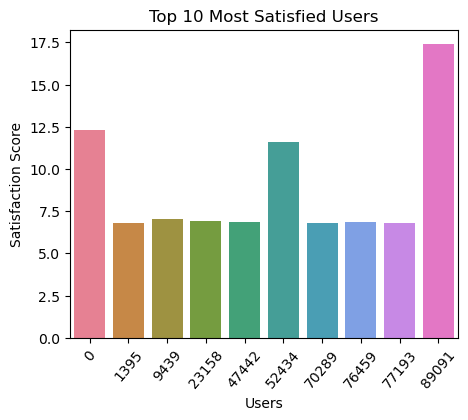

In [143]:
a = avg_score_df.sort_values(by='satisfaction_score', ascending=False).head(10)
plt.figure(figsize=(5, 4))
plt.xticks(rotation=50)
sns.barplot(x=a.index, y=a['satisfaction_score'], palette=sns.color_palette("husl", len(a)))
plt.title("Top 10 Most Satisfied Users")
plt.xlabel("Users")
plt.ylabel("Satisfaction Score")
plt.show()

### Run a regression model of your choice to predict the satisfaction score of a customer. 
Working with the 4 features

In [144]:
all_variables = avg_score_df[['MSISDN/Number','engagement_score', 'experience_score', 'satisfaction_score']]
all_variables.head()

,MSISDN/Number,engagement_score,experience_score,satisfaction_score
0,3.360416e+10,11.436165,13.132200,12.284183
1,3.360417e+10,1.367844,6.237983,3.802913
2,3.360417e+10,0.102609,0.523194,0.312902
3,3.360418e+10,0.605355,6.274405,3.439880
4,3.360418e+10,1.971276,5.081596,3.526436


In [145]:
# split  dataset into train and test sets
x = all_variables.drop(['satisfaction_score'], axis = 1)
y = all_variables[['satisfaction_score']]
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = .3, random_state = 0)
print('xtrain shape:', x_train.shape)
print('xtest shape:', x_test.shape)
print('ytrain shape:', y_train.shape)
print('ytest shape:', y_test.shape)

xtrain shape: (62364, 3)
xtest shape: (26728, 3)
ytrain shape: (62364, 1)
ytest shape: (26728, 1)


In [146]:
x_train = x_train.drop(['MSISDN/Number'], axis = 1)
test_user = x_test[['MSISDN/Number']]
x_test = x_test.drop(['MSISDN/Number'], axis = 1)
print('xtrain shape:', x_train.shape)
print('xtest shape:', x_test.shape)
print('users df shape:', test_user.shape)

xtrain shape: (62364, 2)
xtest shape: (26728, 2)
users df shape: (26728, 1)


In [147]:
# Models hyperparameters tuning
# I intend to observe the performance of 3 models (2 boosters and one ensemble method) then use the one with the lowest MSE score to predict the x_test set.

# Random Forest
regressor = RandomForestRegressor(n_estimators=300, random_state=0)

#gradboost
gdb = GradientBoostingRegressor(n_estimators=2000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =0)
#xgboost
xgb = XGBRegressor(colsample_bytree=0.4603, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=0,
                             random_state =0, nthread = -1)

In [148]:
# rf prediction
regressor.fit(x_train.values, y_train)
rf_pred = regressor.predict(x_test.values)

In [149]:
# xgb prediction
xgb.fit(x_train.values, y_train)
xgb_pred = xgb.predict(x_test.values)

In [150]:
# gdb prediction
gdb.fit(x_train.values, y_train)
gdb_pred = gdb.predict(x_test.values)

In [151]:
print("Mean absolute error for random forest on test data =", mean_absolute_error(y_test, rf_pred))
print("Mean absolute error for xgboost on test data=", mean_absolute_error(y_test, xgb_pred))
print("Mean absolute error for gradboost on test data=", mean_absolute_error(y_test, gdb_pred))

print("\nMean squared error for random forest on test data =", mean_squared_error(y_test, rf_pred))
print("Mean squared error for xgboost on test data=", mean_squared_error(y_test, xgb_pred))
print("Mean squared error for gradboost on test data=", mean_squared_error(y_test, gdb_pred))

Mean absolute error for random forest on test data = 0.0022180801415707142
Mean absolute error for xgboost on test data= 0.008404614940177716
Mean absolute error for gradboost on test data= 0.0056759773091108

Mean squared error for random forest on test data = 3.495561837118098e-05
Mean squared error for xgboost on test data= 0.0006728754272087508
Mean squared error for gradboost on test data= 7.719482583712967e-05


## Working with the randomforest predictions since it has the smallest mean squared error.

In [152]:
# save predictions.
predictions = pd.DataFrame()
predictions['users'] = test_user['MSISDN/Number']
predictions['satisfaction_score'] = rf_pred
print(predictions.shape)
predictions.head()

(26728, 2)


,users,satisfaction_score
13034,3.362743e+10,4.004134
18871,3.364273e+10,1.555910
13080,3.362751e+10,3.461988
50846,3.366329e+10,0.616041
50301,3.366315e+10,2.865325


### Run a k-means (k=2) on the engagement & the experience score. 

In [153]:
ds = avg_score_df[['MSISDN/Number', 'engagement_score', 'experience_score']]
k_means = KMeans(n_clusters = 2, init = 'k-means++', random_state = 0)
k_means.fit(ds)
clusters=k_means.predict(ds)
ds['clusters'] = clusters
ds.tail()

,MSISDN/Number,engagement_score,experience_score,clusters
89087,3.370000e+10,0.383019,7.745850,0
89088,3.370000e+10,3.112273,2.140058,0
89089,3.370000e+10,1.343179,1.948271,0
89090,3.370000e+10,0.925276,7.745850,0
89091,3.373042e+10,16.064821,18.693046,0


### Aggregate the average engagement & experience score per cluster

In [154]:
cluster_agg = ds.groupby('clusters').agg({'experience_score':'mean', 'engagement_score':'mean'})
cluster_agg

,experience_score,engagement_score
clusters,,
0,3.728765,1.252460
1,4.076558,1.297889


In [155]:
df2.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),DL TP > 1 Mbps (%),UL TP < 10 Kbps (%),10 Kbps < UL TP < 50 Kbps (%),50 Kbps < UL TP < 300 Kbps (%),UL TP > 300 Kbps (%),Activity Duration DL (ms),Activity Duration UL (ms),Dur. (ms).1,Handset Manufacturer,Handset Type,Nb of sec with Vol DL < 6250B,Nb of sec with Vol UL < 1250B,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes),Total Duration (ms),Decile Class,Decile_rank,Total_bytes
0,1.311450e+19,2019-04-04 12:01:00,770.0,2019-04-25 14:35:00,662.0,244912.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16457E+15,42.0,5.0,23.0,44.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,37624.0,38787.0,244913628.0,Samsung,Samsung Galaxy A5 Sm-A520F,213.0,214.0,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0,489824.0,9,4,345629377.0
1,1.311450e+19,2019-04-09 13:04:00,235.0,2019-04-25 08:15:00,606.0,244912.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,65.0,5.0,16.0,26.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,168.0,3560.0,244913628.0,Samsung,Samsung Galaxy J5 (Sm-J530),971.0,1022.0,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0,489824.0,9,4,707185356.0
2,1.311450e+19,2019-04-09 17:42:00,1.0,2019-04-25 11:58:00,652.0,244912.0,2.082008e+14,3.373042e+10,3.528151e+13,D42335A,45.0,5.0,6.0,9.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,244913628.0,Samsung,Samsung Galaxy A8 (2018),751.0,695.0,1684053.0,42224.0,8535055.0,1694064.0,2690151.0,672973.0,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0,952915787.0,10,4,307690973.0
3,1.311450e+19,2019-04-10 00:31:00,486.0,2019-04-25 07:36:00,171.0,244912.0,2.082014e+14,3.373042e+10,3.535661e+13,T21824A,45.0,5.0,44.0,44.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,3330.0,37882.0,244913628.0,undefined,undefined,17.0,207.0,644121.0,13372.0,9023734.0,2788027.0,1439754.0,631229.0,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0,244912.0,7,4,889352748.0
4,1.311450e+19,2019-04-12 20:10:00,565.0,2019-04-25 10:40:00,954.0,244912.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,45.0,5.0,6.0,9.0,100.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,244913628.0,Samsung,Samsung Sm-G390F,607.0,604.0,862600.0,50188.0,6248284.0,1500559.0,1936496.0,173853.0,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0,244912.0,7,4,607681403.0


###  Export Jupyter Notebook file on Mysql Server

In [160]:
from sqlalchemy import create_engine

# Define SQL Server connection details
server = 'DESKTOP-BLC7SRT\SQLEXPRESS'  # The name of your server
database = 'master'  # The database you want to connect to

# Create a connection string with a trusted connection
connection_url = f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&trusted_connection=yes"

# Create an engine
engine = create_engine(connection_url)

# Transfer data to SQL Server
table_name = 'telcom_data'
df2.to_sql(table_name, engine, if_exists='replace', index=False)

# Confirm completion
print(f"Dataset transferred to SQL Server table: {table_name}")

# Dispose the engine
engine.dispose()

Dataset transferred to SQL Server table: telcom_data
